#  Exploratory Data Analysis -Customer Retention Dataset

*Problem Description*

ABC Bank wants to employ various strategies this quarter to retain the customer pool and prevent from churning. They have approached Mind Matrix Analytics (MMA), a consultant group to study their current strategies and identify challenges in achieving their goal.
The bank wants to know:
- Which variables are significant in predicting the customer's duration with the bank
 
- How well those variables describe the customer's duration with the bank

- Based on data, the consulting firm has to look at how well the bank is performing with their different customer segments.

## Table of Contents
1. Quality check of data
2. Missing data
3. Derivative features
4. Removing duplicates from dataset
5. Subsets of data
6. Univariate Analysis
7. Bi-variate Analysis
8. Outlier Analysis
9. Correlation Analysis
10. Customer, Segment, Product Analysis
11. Statistical analysis

  

In [108]:
# Importing package.

import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
from scipy import stats
import plotly.express as px


In [2]:
# Reading CSV file into Pandas DataFrame.

cr = pd.read_csv('Customer Retention Case Study Data.csv')

Understand the data and quality of data by describing the data 
# 1. Quality check of data

In [3]:
# Printing first 5 records of the dataset.

cr.head()

,gender,age,gross_income,segment,num_credit_cards,active_inactive_start,active_inactive_end,num_products,num_loans,duration
0,M,21,79070.91,Individuals,0,I,0,1,0,1035
1,M,23,178270.68,College_Graduated,0,I,0,1,0,1097
2,M,24,31243.56,College_Graduated,0,I,1,1,0,1866
3,M,24,130740.54,College_Graduated,0,I,0,1,0,1440
4,M,31,112975.17,Individuals,0,I,0,0,0,376


In [4]:
# Understanding data types.

cr.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 54030 entries, 0 to 54029
Data columns (total 10 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   gender                 54030 non-null  object 
 1   age                    54030 non-null  int64  
 2   gross_income           54030 non-null  float64
 3   segment                54030 non-null  object 
 4   num_credit_cards       54030 non-null  int64  
 5   active_inactive_start  54030 non-null  object 
 6   active_inactive_end    54030 non-null  int64  
 7   num_products           54030 non-null  int64  
 8   num_loans              54030 non-null  int64  
 9   duration               54030 non-null  int64  
dtypes: float64(1), int64(6), object(3)
memory usage: 4.1+ MB


There are 10 records

In [5]:
# Checking dimension of dataframe

cr.shape

(54030, 10)

In [6]:
# Checking data included as Objects

cr.describe(include = ['O'])

,gender,segment,active_inactive_start
count,54030,54030,54030
unique,2,3,2
top,F,Individuals,I
freq,29681,32607,29026


# 2. Missing data

In [7]:
# Checking for null values.

cr.isnull().sum()

gender                   0
age                      0
gross_income             0
segment                  0
num_credit_cards         0
active_inactive_start    0
active_inactive_end      0
num_products             0
num_loans                0
duration                 0
dtype: int64

There are no null values in the dataset

# 3. Derivative features

In [8]:
#Adding a column to derive a column of duration in years
cr['customer_duration'] = 365

In [9]:
cr

,gender,age,gross_income,segment,num_credit_cards,active_inactive_start,active_inactive_end,num_products,num_loans,duration,customer_duration
0,M,21,79070.91,Individuals,0,I,0,1,0,1035,365
1,M,23,178270.68,College_Graduated,0,I,0,1,0,1097,365
2,M,24,31243.56,College_Graduated,0,I,1,1,0,1866,365
3,M,24,130740.54,College_Graduated,0,I,0,1,0,1440,365
4,M,31,112975.17,Individuals,0,I,0,0,0,376,365
...,...,...,...,...,...,...,...,...,...,...,...
54025,M,24,47237.01,College_Graduated,0,I,1,1,0,1147,365
54026,F,46,106930.05,Individuals,1,A,1,8,0,6061,365
54027,M,24,185323.05,College_Graduated,0,I,0,0,0,1817,365
54028,F,27,65246.79,College_Graduated,0,I,0,1,0,1447,365


In [10]:
cr.info() #checking for data type of modified dataset

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 54030 entries, 0 to 54029
Data columns (total 11 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   gender                 54030 non-null  object 
 1   age                    54030 non-null  int64  
 2   gross_income           54030 non-null  float64
 3   segment                54030 non-null  object 
 4   num_credit_cards       54030 non-null  int64  
 5   active_inactive_start  54030 non-null  object 
 6   active_inactive_end    54030 non-null  int64  
 7   num_products           54030 non-null  int64  
 8   num_loans              54030 non-null  int64  
 9   duration               54030 non-null  int64  
 10  customer_duration      54030 non-null  int64  
dtypes: float64(1), int64(7), object(3)
memory usage: 4.5+ MB


In [11]:
cr['duration_years'] = cr['duration'] / cr['customer_duration'] #Deriving a new column to see duration of customers in years

In [12]:
cr

,gender,age,gross_income,segment,num_credit_cards,active_inactive_start,active_inactive_end,num_products,num_loans,duration,customer_duration,duration_years
0,M,21,79070.91,Individuals,0,I,0,1,0,1035,365,2.835616
1,M,23,178270.68,College_Graduated,0,I,0,1,0,1097,365,3.005479
2,M,24,31243.56,College_Graduated,0,I,1,1,0,1866,365,5.112329
3,M,24,130740.54,College_Graduated,0,I,0,1,0,1440,365,3.945205
4,M,31,112975.17,Individuals,0,I,0,0,0,376,365,1.030137
...,...,...,...,...,...,...,...,...,...,...,...,...
54025,M,24,47237.01,College_Graduated,0,I,1,1,0,1147,365,3.142466
54026,F,46,106930.05,Individuals,1,A,1,8,0,6061,365,16.605479
54027,M,24,185323.05,College_Graduated,0,I,0,0,0,1817,365,4.978082
54028,F,27,65246.79,College_Graduated,0,I,0,1,0,1447,365,3.964384


# 4.  Removing duplicates from dataset

In [13]:
cr.drop_duplicates(inplace = True) #removing duplicates

In [14]:
cr.describe()

,age,gross_income,num_credit_cards,active_inactive_end,num_products,num_loans,duration,customer_duration,duration_years
count,52839.000000,5.283900e+04,52839.000000,52839.000000,52839.000000,52839.000000,52839.000000,52839.0,52839.000000
mean,40.782490,1.342687e+05,0.050228,0.469634,1.537898,0.009330,2914.713242,365.0,7.985516
std,17.203393,2.418738e+05,0.218417,0.499082,1.581192,0.096142,2028.241321,0.0,5.556826
min,2.000000,2.336010e+03,0.000000,0.000000,0.000000,0.000000,366.000000,365.0,1.002740
25%,25.000000,6.861658e+04,0.000000,0.000000,1.000000,0.000000,1118.000000,365.0,3.063014
50%,40.000000,1.015898e+05,0.000000,0.000000,1.000000,0.000000,2048.000000,365.0,5.610959
75%,51.000000,1.560876e+05,0.000000,1.000000,2.000000,0.000000,4691.500000,365.0,12.853425
max,112.000000,2.889440e+07,1.000000,1.000000,13.000000,1.000000,7909.000000,365.0,21.668493


In [15]:
#Exporting new version of dataset
#cr.to_csv(r'C:\Users\jay62\Downloads\Course 29\Case Study 4_Customer Retention\eda_cr_file.csv')

# 5. Subsets of data

In [16]:
#Creating filtered sub set o data- for activity and gender
all_time_active = cr[(cr['active_inactive_start'] == 'A') &  (cr['active_inactive_end'] == 1)]
m_all_time_active = all_time_active['gender'] == 'M'
f_all_time_active = all_time_active['gender'] == 'F'
m_f_active_all_time = [m_all_time_active & f_all_time_active]

In [17]:
#Activity of customers filtered- Only active customers
active_from_b_e = cr['active_inactive_start'] == 'A'
active_after_six_months = cr['active_inactive_end'] == 1
active_all_time = cr[active_from_b_e & active_after_six_months]

# 6. Univariate Analysis:

- If categorical, value_counts/ bar plot
- If numerical, Histogram

In [18]:
#all numerical data columns
num_col=cr.select_dtypes(include=['int', 'float']).columns
num_col

Index(['age', 'gross_income', 'num_credit_cards', 'active_inactive_end',
       'num_products', 'num_loans', 'duration', 'customer_duration',
       'duration_years'],
      dtype='object')

In [19]:
#Taking only relevant numerical columns (remaining are categorical)
num_col= ['age', 'gross_income','num_products', 'duration','duration_years']

Value count for age


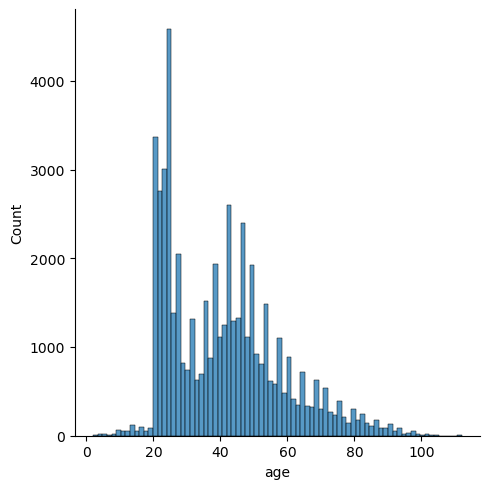

**************************************************
Value count for gross_income


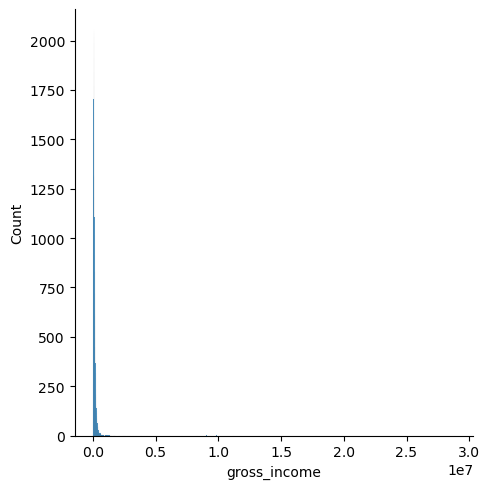

**************************************************
Value count for num_products


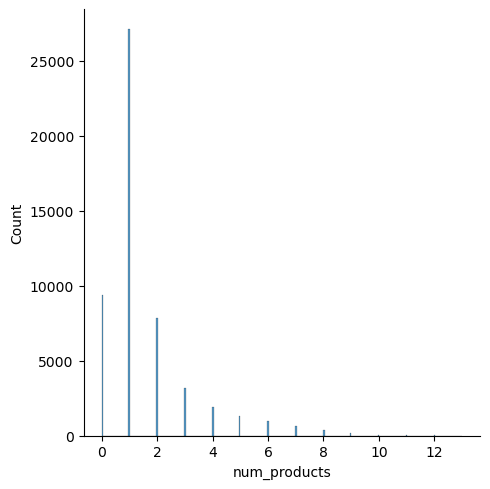

**************************************************
Value count for duration


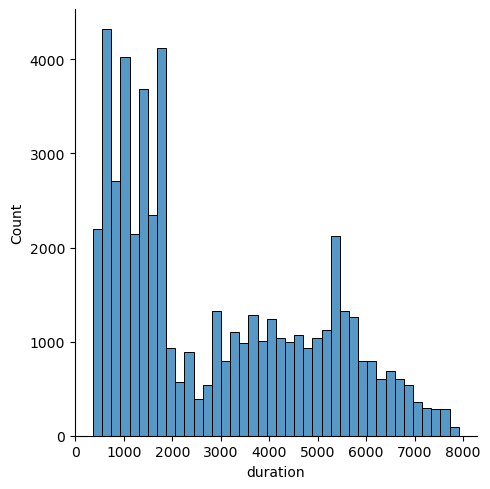

**************************************************
Value count for duration_years


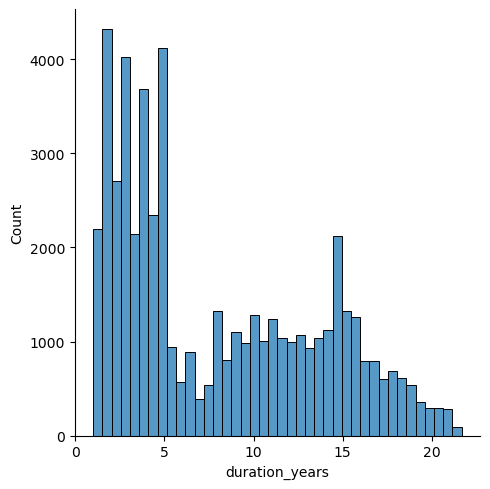

**************************************************


In [20]:
#histogram for numerical data columns
for i in num_col:
    print("Value count for", i)
    sns.displot(cr[i])
    plt.show()
    print("*"*50)

### We are analysing under ' assumption ' that the following numerical columns are binary and convert it into category type

In [ ]:
## Typecast to Categorical column in pandas
 
#cr[['num_credit_cards', 'num_loans']] = pd.Categorical(cr[['active_inactive_end','num_credit_cards', 'active_inactive_end', 'num_loans']])
#cr.dtypes

In [21]:
#all categorical data columns
cat_col=cr.select_dtypes(include=['object']).columns
cat_col

Index(['gender', 'segment', 'active_inactive_start'], dtype='object')

Value count for gender


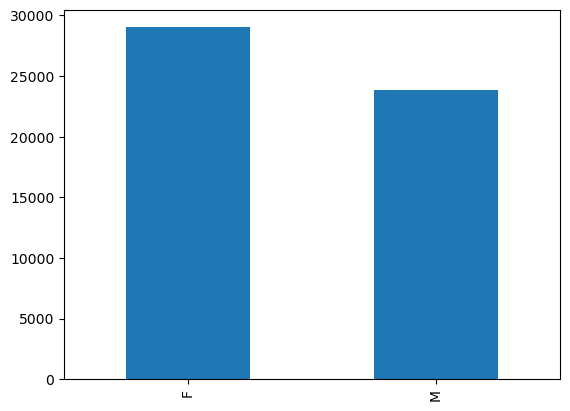

**************************************************
Value count for segment


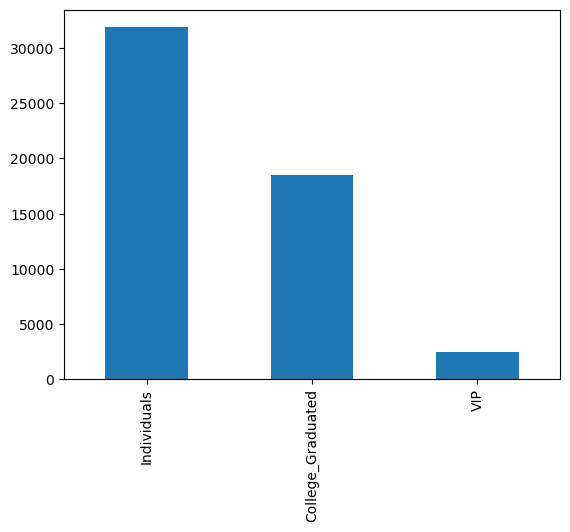

**************************************************
Value count for active_inactive_start


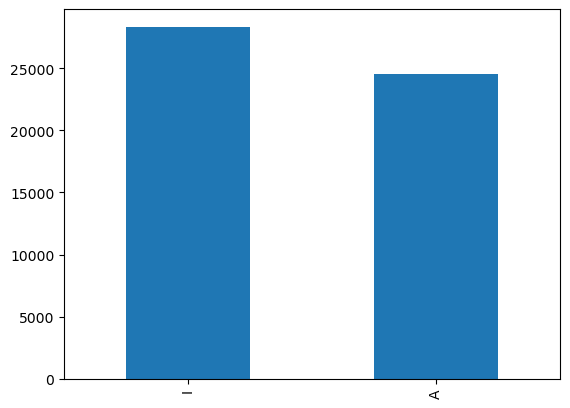

**************************************************


In [22]:
# bar graphs- all categorical data columns value counts
for i in cat_col:
    print("Value count for", i)
    cr[i].value_counts().plot(kind='bar')
    plt.show()
    print("*"*50)
#More in-depth analysis to follow...

# 7. Bi-variate Analysis:
- Scatterplot
- Variance/ Std Dev

In [23]:
#variance of numerical col
cr[num_col].var()

age               2.959567e+02
gross_income      5.850294e+10
num_products      2.500168e+00
duration          4.113763e+06
duration_years    3.087831e+01
dtype: float64

In [24]:
#std dev of numerical col
cr[num_col].std()

age                   17.203393
gross_income      241873.819689
num_products           1.581192
duration            2028.241321
duration_years         5.556826
dtype: float64

Value count for age


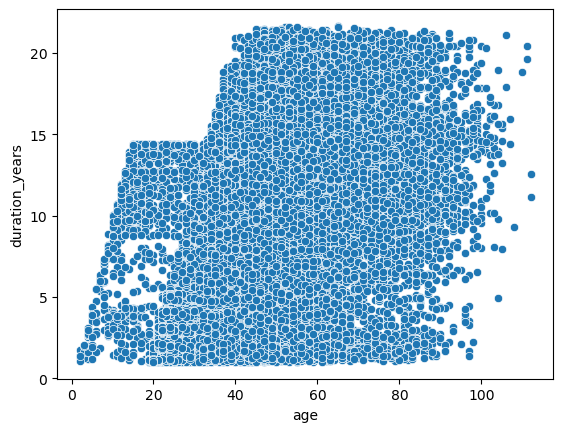

**************************************************
Value count for gross_income


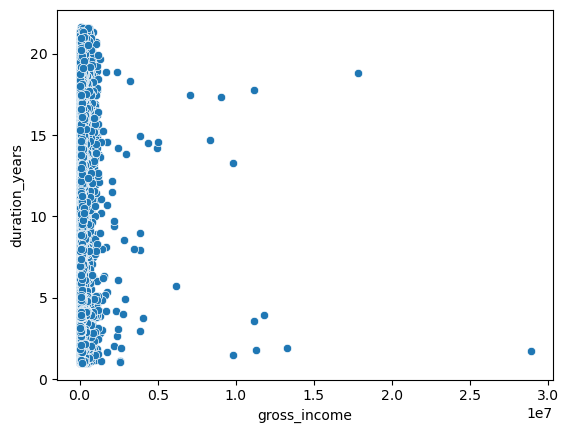

**************************************************
Value count for num_products


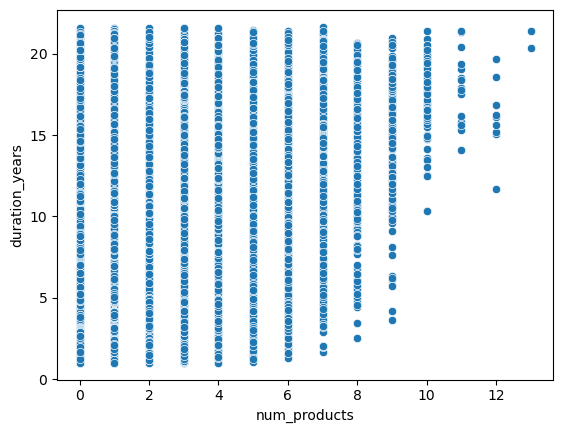

**************************************************
Value count for duration


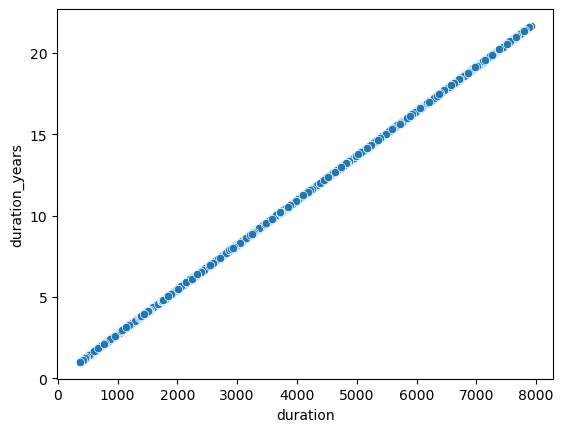

**************************************************
Value count for duration_years


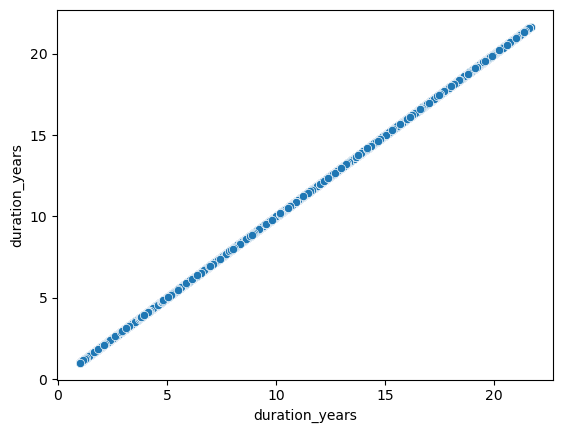

**************************************************


In [25]:
#scatterplots- numerical only
for i in num_col:
    print("Value count for", i)
    sns.scatterplot(data=cr, x=i, y= cr["duration_years"])
    plt.show()
    print("*"*50)

# 8. Outlier Analysis
- Box plots

In [26]:
cr.describe() #descriptive stats of numerical columns in dataset

,age,gross_income,num_credit_cards,active_inactive_end,num_products,num_loans,duration,customer_duration,duration_years
count,52839.000000,5.283900e+04,52839.000000,52839.000000,52839.000000,52839.000000,52839.000000,52839.0,52839.000000
mean,40.782490,1.342687e+05,0.050228,0.469634,1.537898,0.009330,2914.713242,365.0,7.985516
std,17.203393,2.418738e+05,0.218417,0.499082,1.581192,0.096142,2028.241321,0.0,5.556826
min,2.000000,2.336010e+03,0.000000,0.000000,0.000000,0.000000,366.000000,365.0,1.002740
25%,25.000000,6.861658e+04,0.000000,0.000000,1.000000,0.000000,1118.000000,365.0,3.063014
50%,40.000000,1.015898e+05,0.000000,0.000000,1.000000,0.000000,2048.000000,365.0,5.610959
75%,51.000000,1.560876e+05,0.000000,1.000000,2.000000,0.000000,4691.500000,365.0,12.853425
max,112.000000,2.889440e+07,1.000000,1.000000,13.000000,1.000000,7909.000000,365.0,21.668493


The box plot of age is:


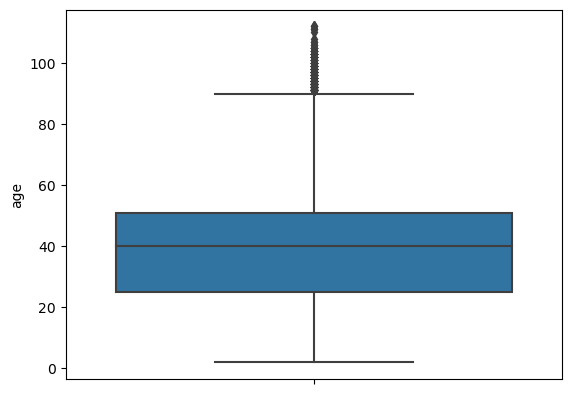

**************************************************
The box plot of gross_income is:


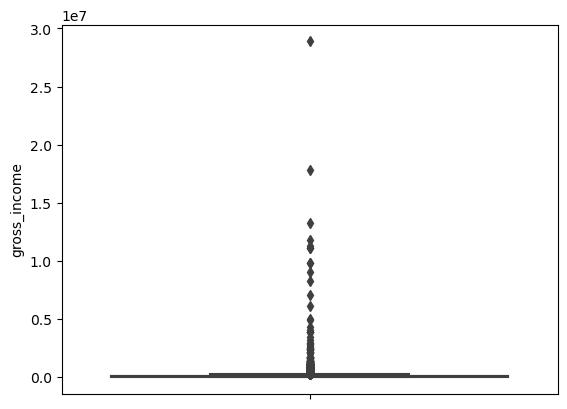

**************************************************
The box plot of num_products is:


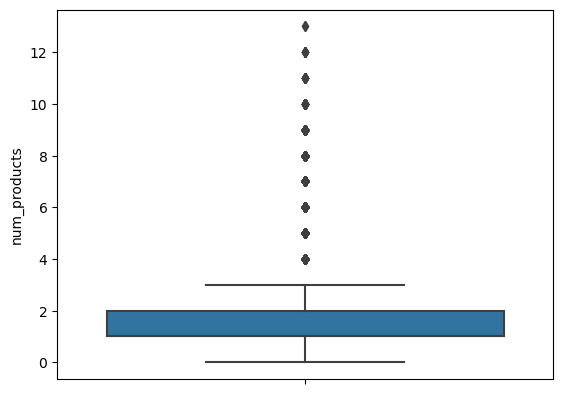

**************************************************
The box plot of duration is:


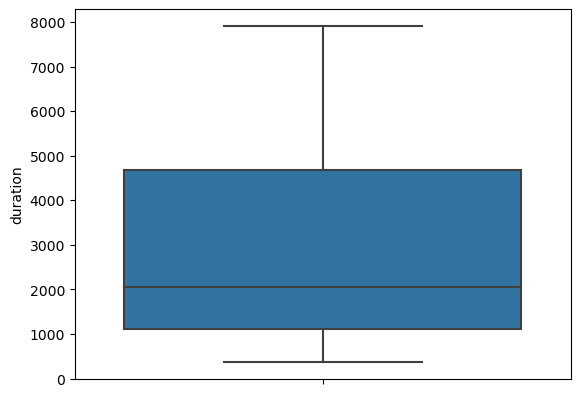

**************************************************
The box plot of duration_years is:


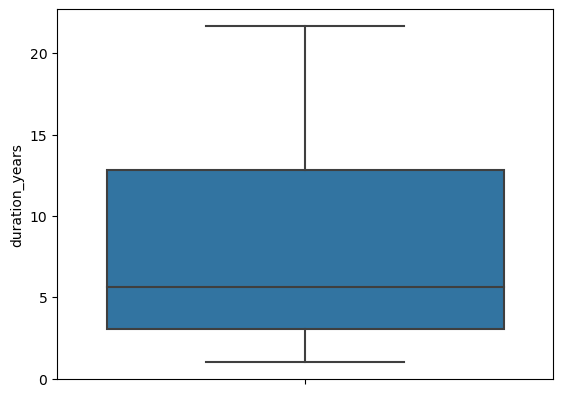

**************************************************


In [27]:
#to check outliers in all variables
#for all numericaldata- boxplots
for i in num_col:
    print("The box plot of", i, "is:")
    sns.boxplot(y= cr[i])
    plt.show()
    print("*"*50)

### There are outliers in Age and Gross income features

# 9. Correlation Analysis

We can find the pairwise correlation between the different columns of the data using the corr() method. (Note – All non-numeric data type column will be ignored.) The resulting coefficient is a value between -1 and 1 inclusive, where:

1: Total positive linear correlation 0: No linear correlation, the two variables most likely do not affect each other -1: Total negative linear correlation

Pearson Correlation is the default method of the function “corr”.

In [28]:
cor= cr.corr()
cor

,age,gross_income,num_credit_cards,active_inactive_end,num_products,num_loans,duration,customer_duration,duration_years
age,1.000000,0.067872,0.095962,0.136667,0.178277,0.042718,0.599903,NaN,0.599903
gross_income,0.067872,1.000000,0.020429,0.024589,0.035704,0.002352,0.077854,NaN,0.077854
num_credit_cards,0.095962,0.020429,1.000000,0.241605,0.552409,0.112872,0.188585,NaN,0.188585
active_inactive_end,0.136667,0.024589,0.241605,1.000000,0.548221,0.093665,0.152135,NaN,0.152135
num_products,0.178277,0.035704,0.552409,0.548221,1.000000,0.206764,0.316047,NaN,0.316047
num_loans,0.042718,0.002352,0.112872,0.093665,0.206764,1.000000,0.101100,NaN,0.101100
duration,0.599903,0.077854,0.188585,0.152135,0.316047,0.101100,1.000000,NaN,1.000000
customer_duration,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
duration_years,0.599903,0.077854,0.188585,0.152135,0.316047,0.101100,1.000000,NaN,1.000000


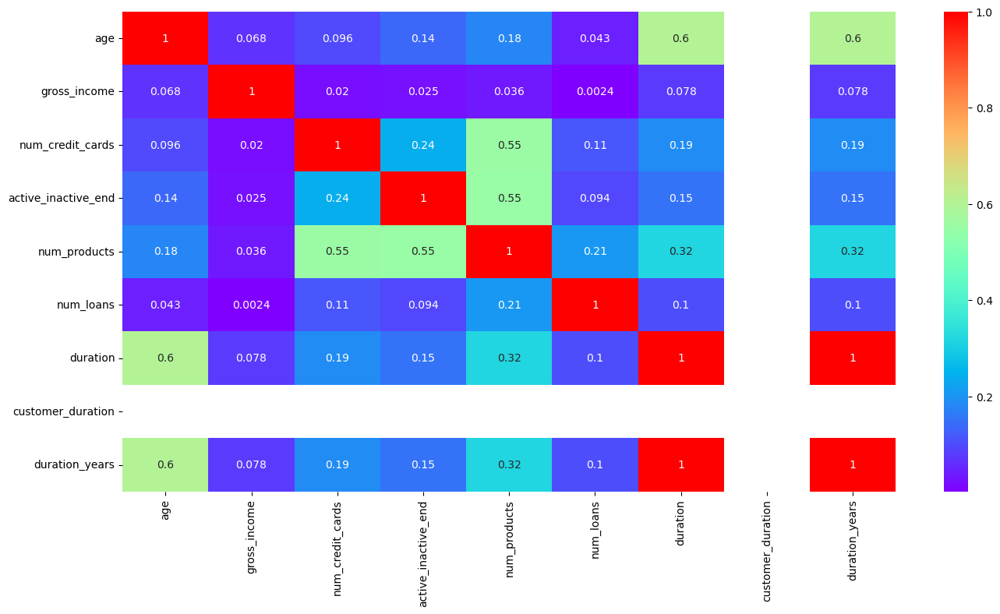

In [29]:
#plotting the correlations on the heatmap
plt.figure(figsize=(16,8))
sns.heatmap(cor, cmap="rainbow", annot=True)
plt.show()

Slight correlation of:
- 0.32 between Duration/Duration_years and Num_products 
- 0.55 between Num_products and num_credit_cards
- 0.21 between num_products and num_loans

Almost negligible correlation (0.036 and 0.078) between Gross_income--Num_products and Gross_income--duration respectively.

Least correlation between 0.0024 between gross_income and num_loans


No negative correlation between any numerical values

# 10. Customer, Segment, Product Analysis

## Customer count

In [30]:
cr['gender'].value_counts()
customer_count = [29025 + 23814]
customer_count

[52839]

## Gender wise customer count 

In [31]:
cr['gender'].value_counts()

F    29025
M    23814
Name: gender, dtype: int64

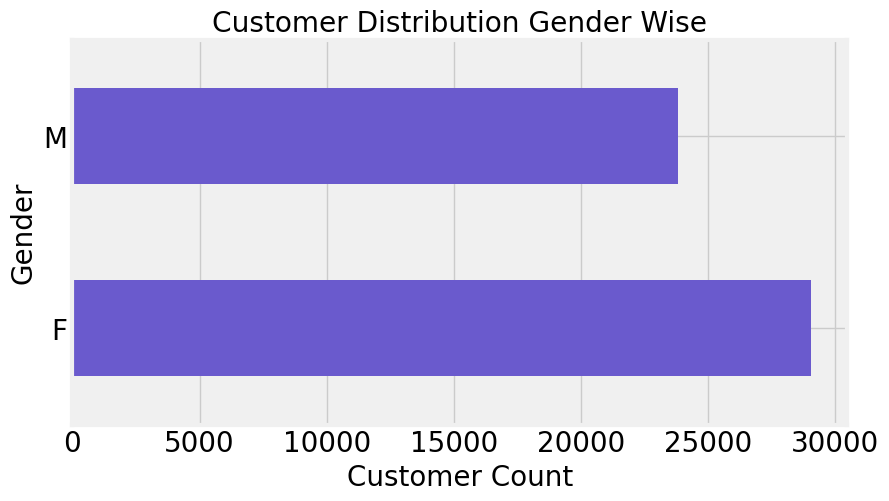

In [32]:
plt.figure(figsize = (10,5))
plt.style.use('fivethirtyeight')
cr['gender'].value_counts().plot(kind = 'barh' , title = 'Customer Distribution Gender Wise',
                                   fontsize = '20' , color = 'slateblue')

plt.xlabel('Customer Count' , fontsize=20, color="black")
plt.ylabel('Gender' , fontsize=20, color="black")
plt.show()

### The dataset contains 23814 males and 29025 females.

## Customer distribution age wise

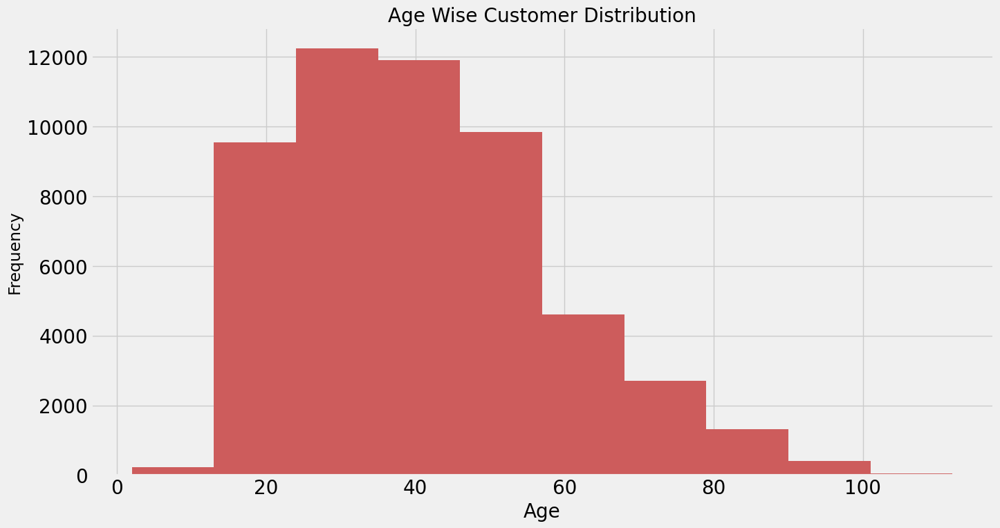

In [33]:
plt.style.use('fivethirtyeight')
plt.figure(figsize = (15,8))
cr['age'].plot(kind = 'hist' , title = 'Age Wise Customer Distribution',
                                   fontsize = '20' , color = 'indianred')

plt.xlabel('Age' , fontsize=20, color="black")
plt.show()

### The age distribution and count. The majority of our consumers are in their twenties, thirties, forties and fifties.


## Top 20 count of customer by age group
### (Plotted down - top 50)

In [34]:
cr['age'].value_counts().sort_values().nlargest(20)

23    3003
24    2799
22    2759
21    2293
25    1781
26    1386
45    1330
43    1313
44    1294
42    1283
46    1250
41    1243
47    1146
40    1110
48    1107
27    1103
20    1070
39    1010
49     966
50     957
Name: age, dtype: int64

## Top 50 by age group

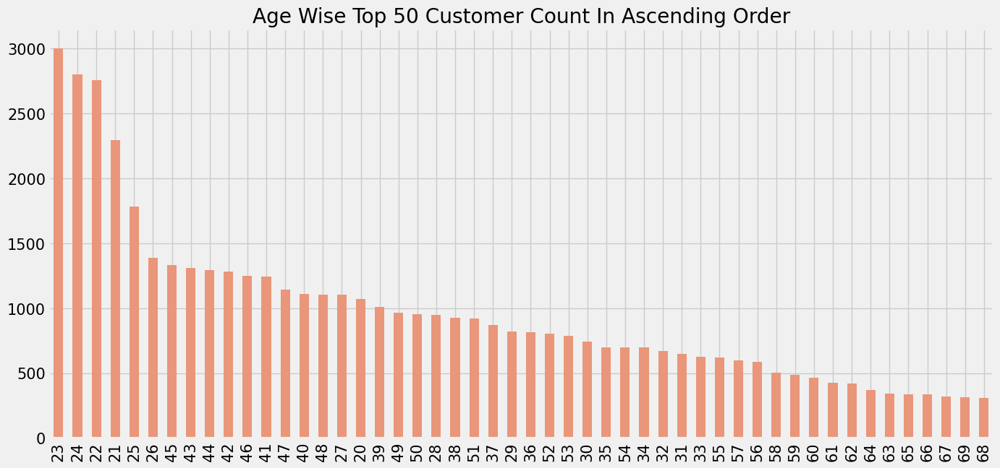

In [35]:
plt.figure(figsize=(15,7))

cr['age'].value_counts().nlargest(50).plot(kind = 'bar' , title = 'Age Wise Top 50 Customer Count In Ascending Order', 
                                   fontsize = '15' , color = 'darksalmon')
plt.show()

### The top six total consumers are in their 20s, followed by the 40s, where we have a good number of total customers. The remaining consumers are in their 30s, 50s, and 60s.


### Because the most clients in their 20s, we have mapped more for them down below.

## Segment wise customer specifically in their 20s (top 6 customer count)

### (The overall segment distribution is plotted below)

In [36]:
top_customer_count = cr['age'].isin([23,24,22,21,25,26])
top_customer_count.sum()

14021

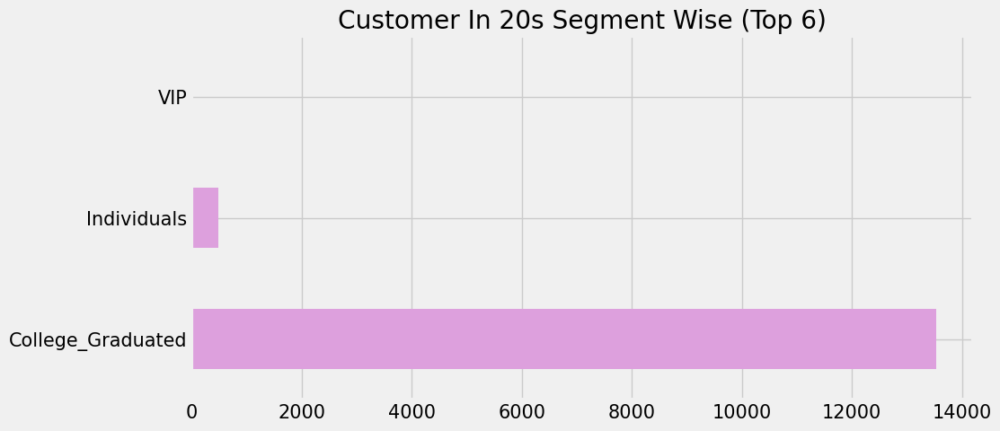

In [37]:
plt.figure(figsize=(10,5))

cr[top_customer_count].segment.value_counts().plot(kind = 'barh' , title = 'Customer In 20s Segment Wise (Top 6)', 
                                   fontsize = '15' , color = 'plum')
plt.show()

### The majority of our consumers are from the College Graduated section, with only a handful from the Individuals group. We don't have any VIP customers in the top six.


## Segment and customer count

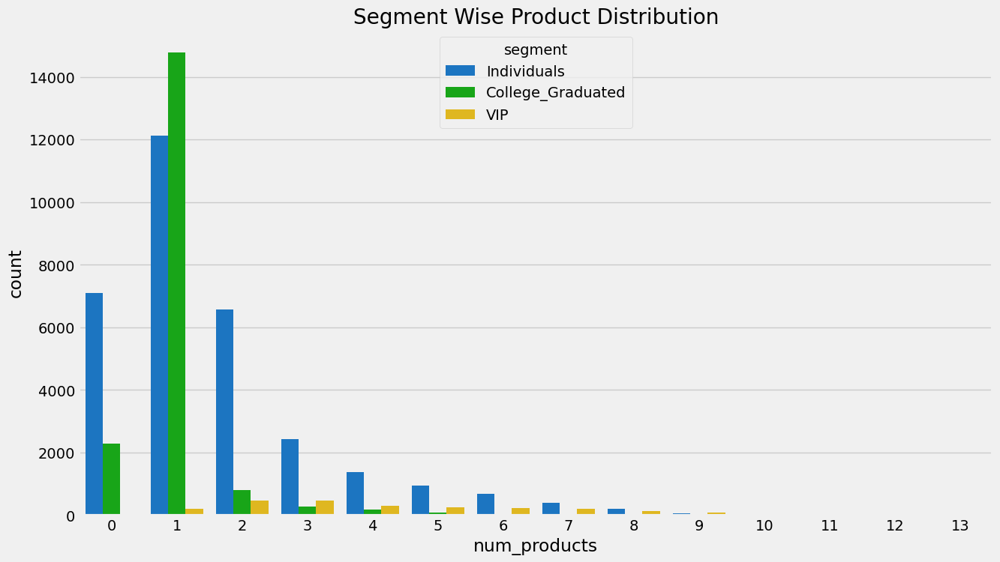

In [38]:
fig , ax = plt.subplots(figsize=(14, 8))

sns.countplot(data= cr, x='num_products', hue = 'segment' , ax = ax , palette = 'nipy_spectral').set(
    title = " Segment Wise Product Distribution ")
plt.show()

### The majority of our customers have only one product from us, and they are from the Individuals and College Grads group. Individuals should receive the most attention because they are more likely to own multiple things.

## Total number of customers who got only 1 product

In [39]:
cr[cr['num_products'] == 1].value_counts().sum()

27108

## Customer in their 20s and product (top 6)

### (Top 6 customers in 20s and their product count)

In [40]:
cr[top_customer_count].num_products.value_counts()

1    11338
0     1908
2      528
3      144
4       69
5       25
6        8
7        1
Name: num_products, dtype: int64

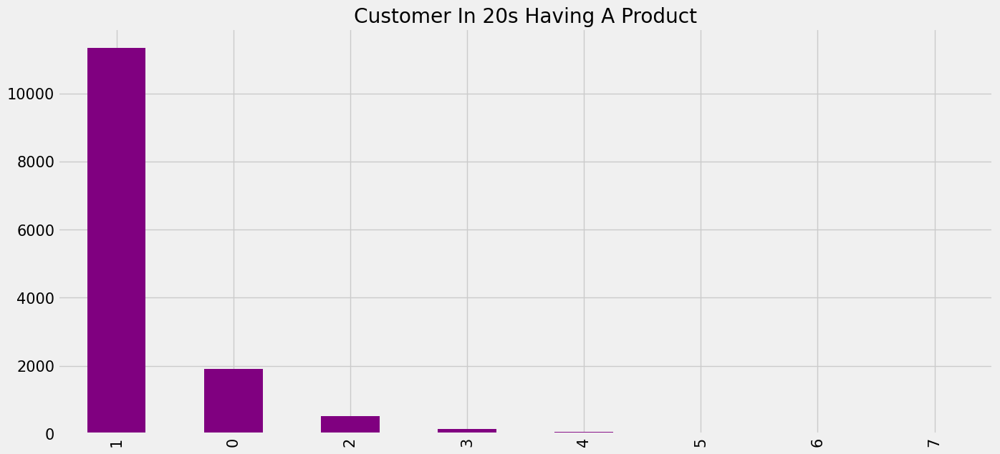

In [41]:
plt.figure(figsize=(15,7))

cr[top_customer_count].num_products.value_counts().plot(kind = 'bar' , title = 'Customer In 20s Having A Product', 
                                   fontsize = '15' , color = 'purple')
plt.show()

### We sold 1 product to a total of 27108 people, however 11338 (around 42%) of those customers were in the early and mid 20s category.


## Top 50 smallest amount of customer count 

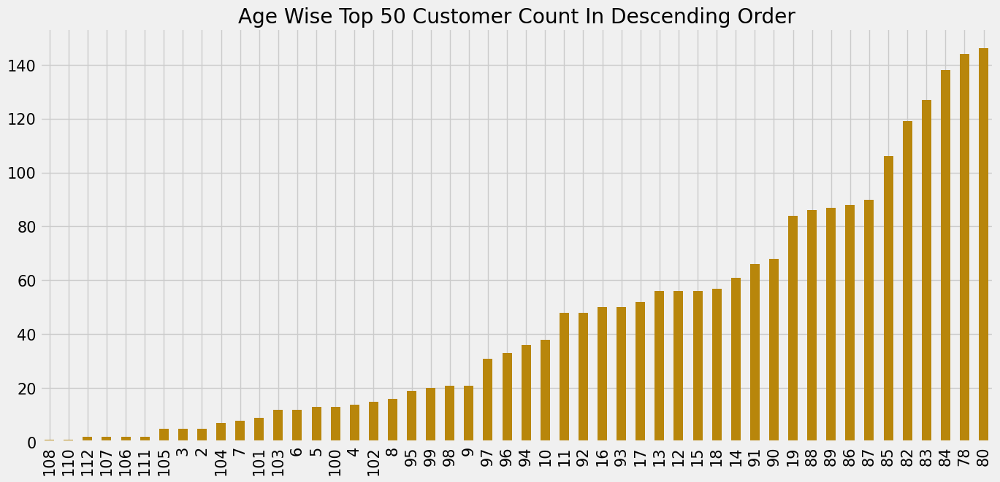

In [42]:
plt.figure(figsize=(15,7))
cr['age'].value_counts().nsmallest(50).plot(kind = 'bar' , title = 'Age Wise Top 50 Customer Count In Descending Order', 
                                   fontsize = '15' , color = 'darkgoldenrod')
plt.show()

### We have less elderly and minor customers.


## Segment wise customer count

In [43]:
cr['segment'].value_counts() 

Individuals          31904
College_Graduated    18510
VIP                   2425
Name: segment, dtype: int64

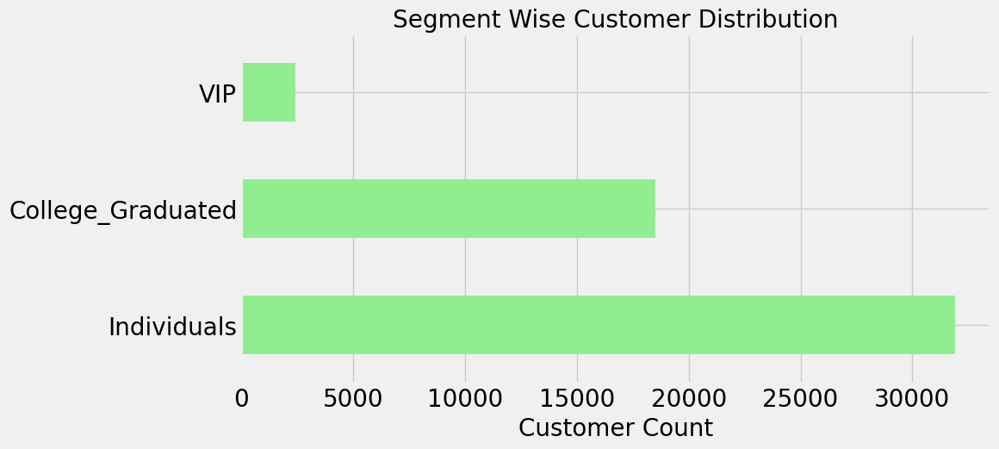

In [44]:
plt.figure(figsize = (10,5))
cr['segment'].value_counts().plot(kind = 'barh' , title = 'Segment Wise Customer Distribution',
                                   fontsize = '20' , color = 'lightgreen')
plt.xlabel('Customer Count' , fontsize=20, color="black")
plt.show()

### The individual segment has the most customers, followed by college graduates and VIPs.

## Segment wise average age

In [45]:
cr.groupby('segment')['age'].mean()

segment
College_Graduated    24.407834
Individuals          49.168913
VIP                  55.435876
Name: age, dtype: float64

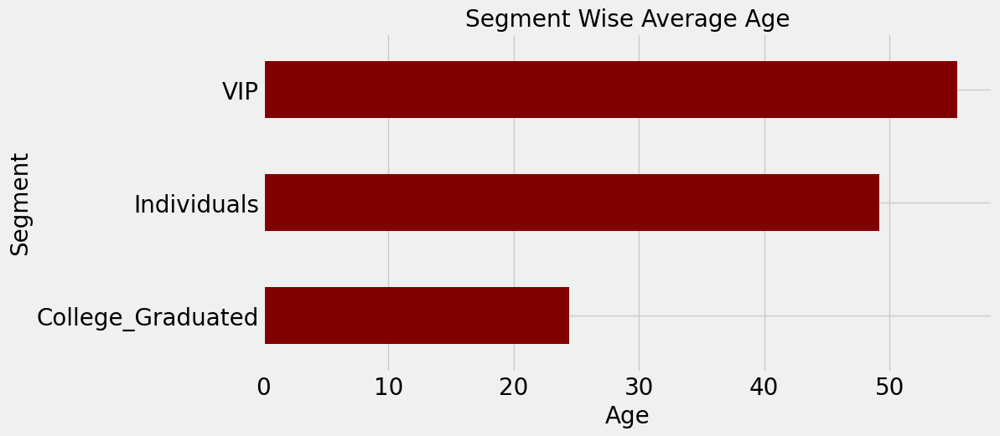

In [46]:
plt.figure(figsize = (10,5))
cr.groupby('segment')['age'].mean().plot(kind = 'barh', title = 'Segment Wise Average Age',
                                   fontsize = '20' , color = 'maroon')
plt.xlabel('Age' , fontsize=20, color="black")
plt.ylabel('Segment' , fontsize=20, color="black")
plt.show()

### According to the segment, the average age is 24.40 for College Graduates, 49.16 for Individuals, and 55.43 for VIPs.


### Age wise customer distribution in all 3 segments

In [47]:
seg_1 = cr['segment'] == 'Individuals'
seg_2 = cr['segment'] == 'College_Graduated'
seg_3 = cr['segment'] == 'VIP'

## Age Wise Largest 50 Count In Individual Segment

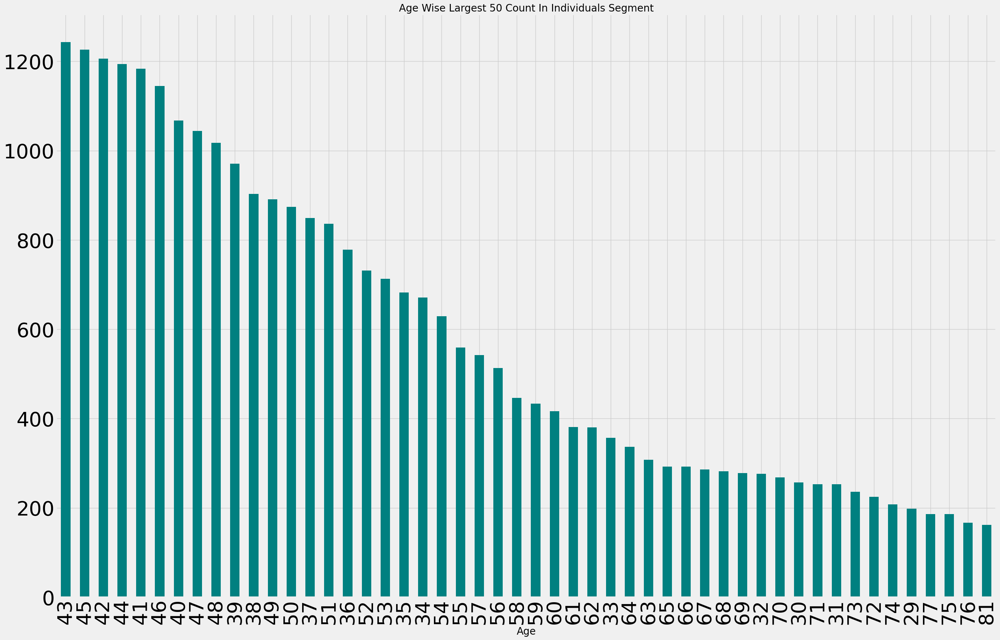

In [48]:
plt.figure(figsize = (30,20))
cr[seg_1].age.value_counts().nlargest(50).plot(kind = 'bar' , title = 'Age Wise Largest 50 Count In Individuals Segment',
                                   fontsize = '40' , color = 'teal')
plt.xlabel('Age' , fontsize=20, color="black")
plt.show()

### We should focus more on clients in their 30s, 40s, and 50s because they make up the majority of the Individuals category.


## Age Wise Largest 30 Count In College Graduated Segment

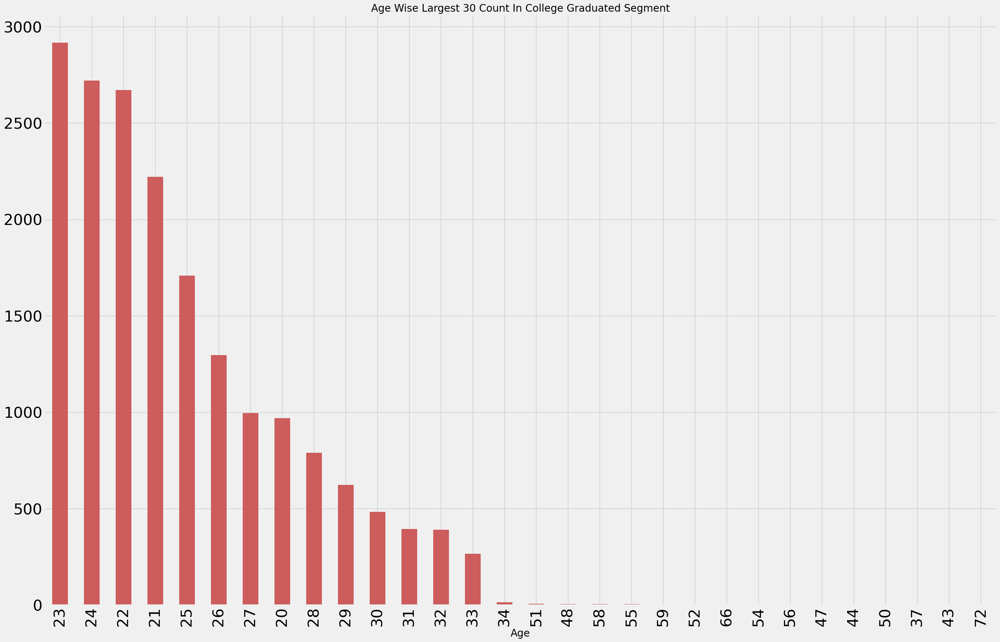

In [49]:
plt.figure(figsize = (30,20))
cr[seg_2].age.value_counts().nlargest(30).plot(kind = 'bar' , title = 'Age Wise Largest 30 Count In College Graduated Segment',
                                   fontsize = '30' , color = 'indianred')
plt.xlabel('Age' , fontsize=20, color="black")
plt.show()

### Customers in the College Grads category are primarily in their twenties, making them a good target for segment growth.
### They account for more than 42% of the total in a list of only one product.


## Age Wise Largest 30 Count In VIP Segment

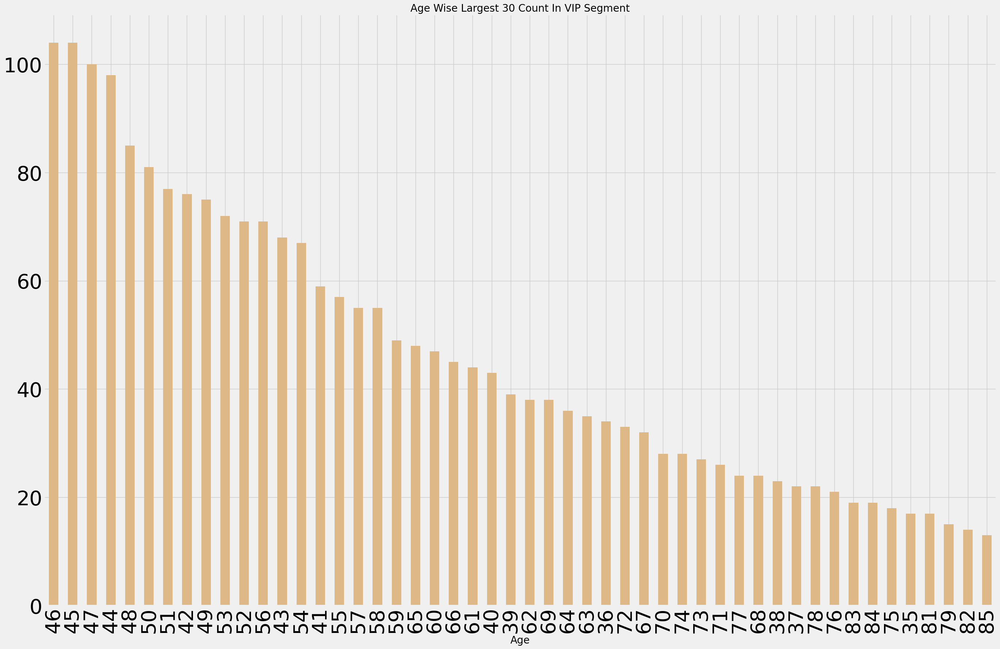

In [50]:
plt.figure(figsize = (30,20))
cr[seg_3].age.value_counts().nlargest(50).plot(kind = 'bar' , title = 'Age Wise Largest 30 Count In VIP Segment',
                                   fontsize = '40' , color = 'burlywood')
plt.xlabel('Age' , fontsize=20, color="black")
plt.show()

### The bulk of VIP customers are in their 40s, 50s, and 60s. This segment's average age is 55, so the target age group would have been between 40 and 60.

# Activity Analysis

## Active and In-active customer in first 6 months

In [51]:
cr['active_inactive_start'].value_counts()

I    28335
A    24504
Name: active_inactive_start, dtype: int64

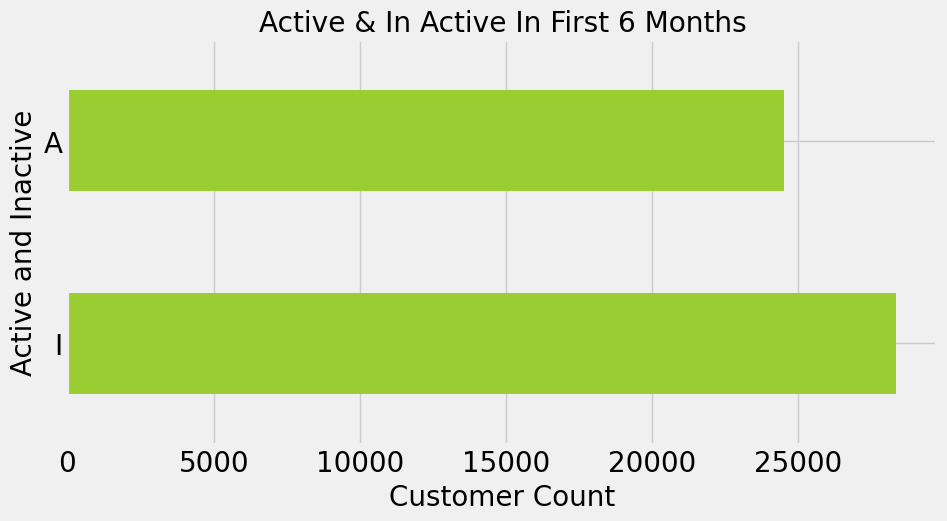

In [52]:
plt.figure(figsize = (10,5))
cr['active_inactive_start'].value_counts().plot(kind = 'barh' ,  title = 'Active & In Active In First 6 Months',
                                   fontsize = '20' , color = 'yellowgreen')
plt.xlabel('Customer Count' , fontsize=20, color="black")
plt.ylabel('Active and Inactive' , fontsize=20, color="black")
plt.show()

### We have more in active consumers within the first six months of a customer's term.

## Active and In-active customer after 6 months

In [53]:
cr['active_inactive_end'].value_counts()

0    28024
1    24815
Name: active_inactive_end, dtype: int64

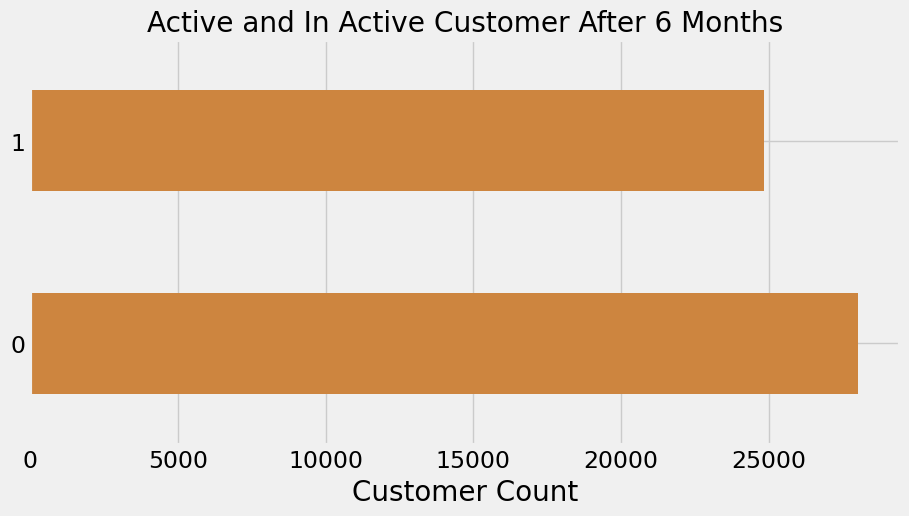

In [54]:
plt.figure(figsize=(10,5))
plt.style.use('fivethirtyeight')

cr['active_inactive_end'].value_counts().plot(kind = 'barh' , 
                                   title = 'Active and In Active Customer After 6 Months',
                                   fontsize = '17' , color = 'peru')

plt.xlabel('Customer Count' , fontsize=20, color="black")
plt.show()

### After 6 months, approximately 300 customers activity level increased.

### We will conduct more analysis on consumer activity after 6 months because we have detected a minor uptick in activity.


## Segment wise activity after 6 months

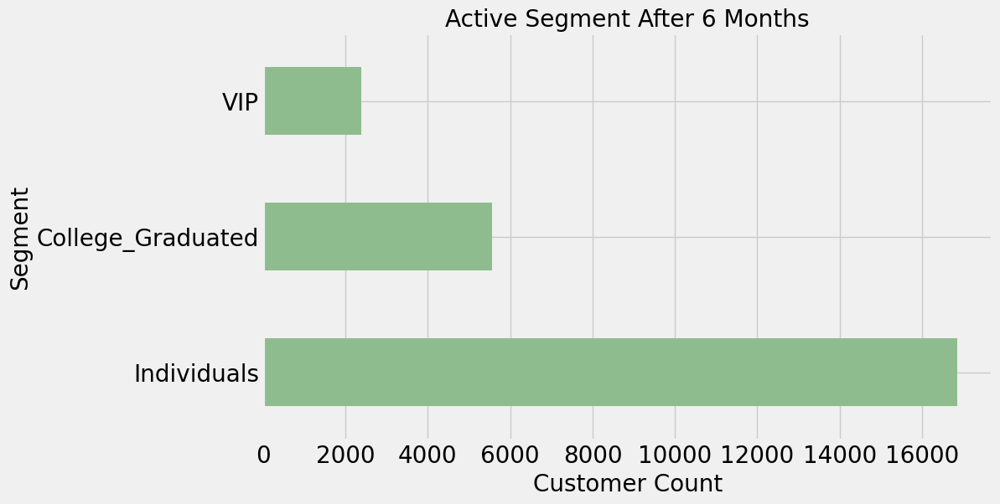

In [55]:
plt.figure(figsize=(10,6))
plt.style.use('fivethirtyeight')


active_after_six_months = cr['active_inactive_end'] == 1


cr[active_after_six_months].segment.value_counts().plot(kind = 'barh' , 
                                   title = 'Active Segment After 6 Months',
                                   fontsize = '20' , color = 'darkseagreen')
plt.xlabel('Customer Count' , fontsize=20, color="black")
plt.ylabel('Segment' , fontsize=20, color="black")
plt.show()

### When we divide clients by their six-month tenure, the Individual category is the most active, accounting for over half of the 32000 total customer count in this section.
### Out of 18510 consumers, around 5000 remained active in the College Graduate sector. 
### Interestingly, out of 2425 VIP customers, around 2100 remained active in the sector. 

## Segment wise IN ACTIVE customer after 6 months

In [56]:
cr[~active_after_six_months].segment.value_counts()

Individuals          15042
College_Graduated    12950
VIP                     32
Name: segment, dtype: int64

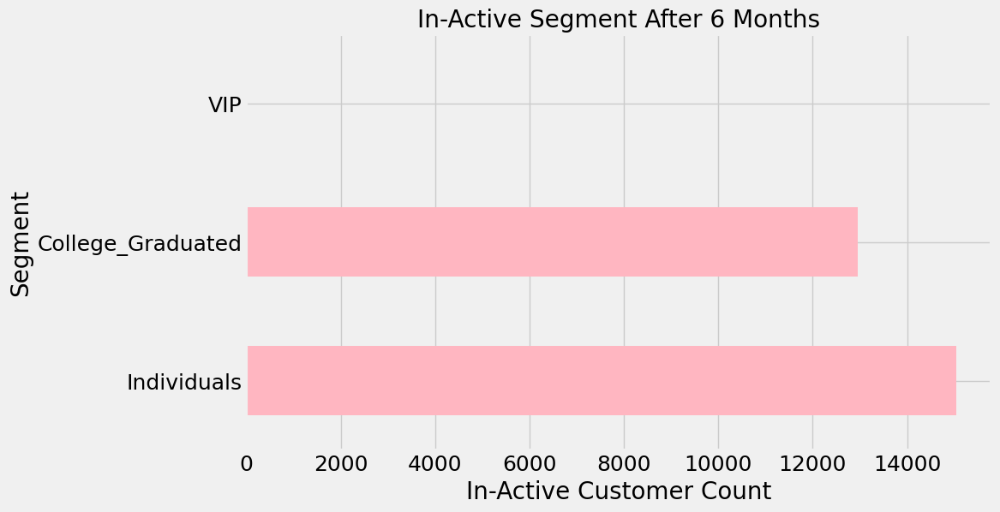

In [57]:
plt.figure(figsize=(10,6))
plt.style.use('fivethirtyeight')

cr[~active_after_six_months].segment.value_counts().plot(kind = 'barh' , 
                                   title = 'In-Active Segment After 6 Months', 
                                   fontsize = '18' , color = 'lightpink')
plt.xlabel('In-Active Customer Count' , fontsize=20, color="black")
plt.ylabel('Segment' , fontsize=20, color="black")
plt.show()

###  After six months, approximately 47% of Individuals and 70% of College Graduates remained inactive.
### We have only 32 inactive VIPs out of 2425 VIPs, demonstrating how important they are in the business across all segments.



## Customer activity status AFTER 6 months as per their tenure

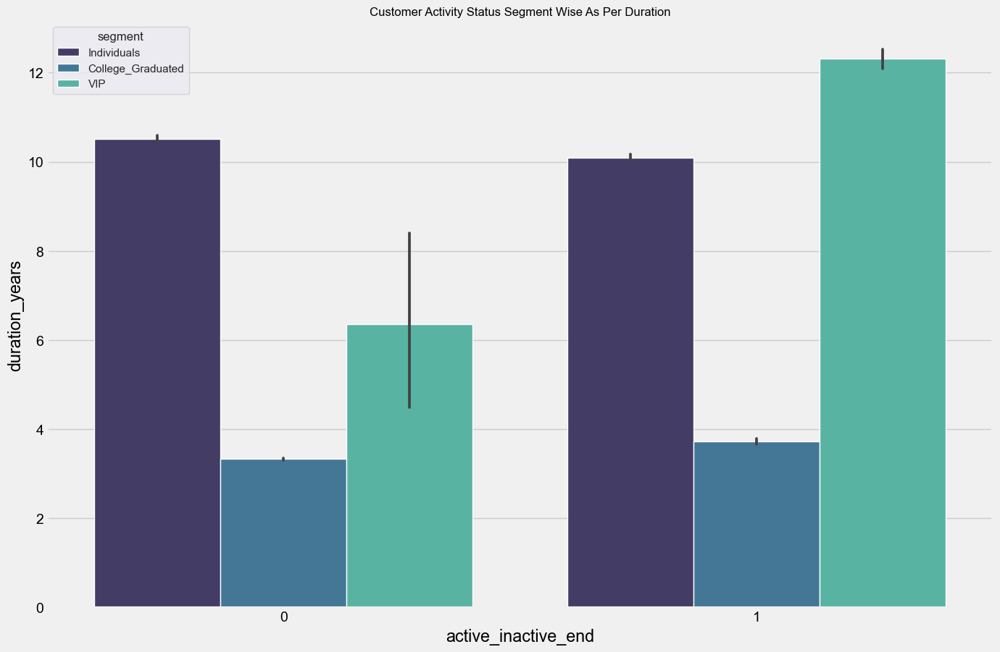

In [58]:
fig , ax = plt.subplots(figsize=(15, 10))
sns.set(style="darkgrid", color_codes=True)


sns.barplot(data = cr, y = 'duration_years', x = 'active_inactive_end' , ax = ax , hue = 'segment' , palette = 'mako').set(
    title="Customer Activity Status Segment Wise As Per Duration")
plt.show()

### 0 is Inactive and 1 is Active
### There is no association between customer duration and activity in the Individual and College Grads segments, with the exception of the VIP group, which clearly states that a greater number of their duration tends to enhance their activity.

## Customer activity status WITHIN 6 month as per their income

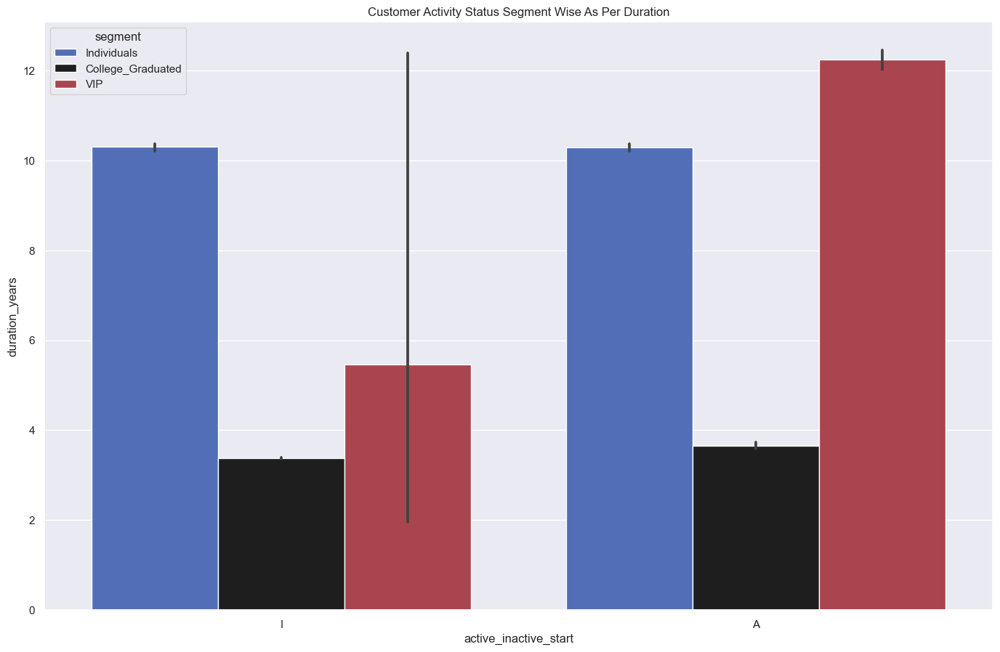

In [59]:
fig , ax = plt.subplots(figsize=(15, 10))
sns.set(style="darkgrid", color_codes=True)


sns.barplot(data = cr, y = 'duration_years', x = 'active_inactive_start', hue = 'segment' , ax = ax, palette = 'icefire').set(
    title="Customer Activity Status Segment Wise As Per Duration")
plt.show()

### All segments have the same amount of activity at the beginning and end.

## Customer activity status AFTER 6 month as per their income

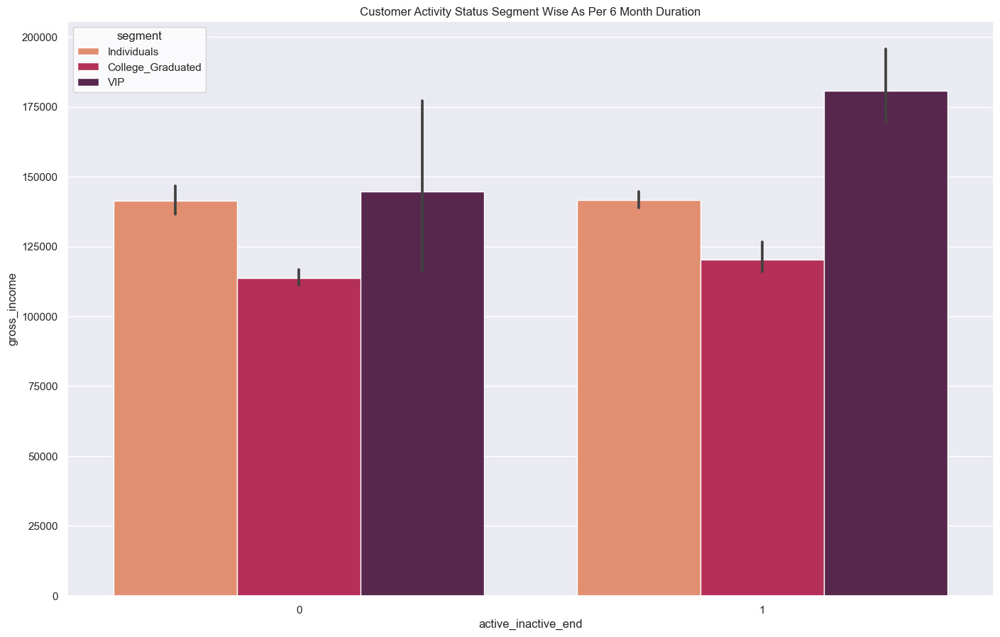

In [60]:
fig , ax = plt.subplots(figsize=(15, 10))
sns.set(style="whitegrid", color_codes=True)

sns.barplot(data = cr, y = 'gross_income', x = 'active_inactive_end', hue = 'segment' , ax = ax, palette = 'rocket_r').set(
    title="Customer Activity Status Segment Wise As Per 6 Month Duration")
plt.show()

### Income and client activity do not play a significant effect in their activity status.

## Gender wise all time activity within 6 month and after 6 month

In [61]:
cr[(cr['active_inactive_start'] == 'A') &  (cr['active_inactive_end'] == 1)].gender.value_counts()

F    13084
M     9352
Name: gender, dtype: int64

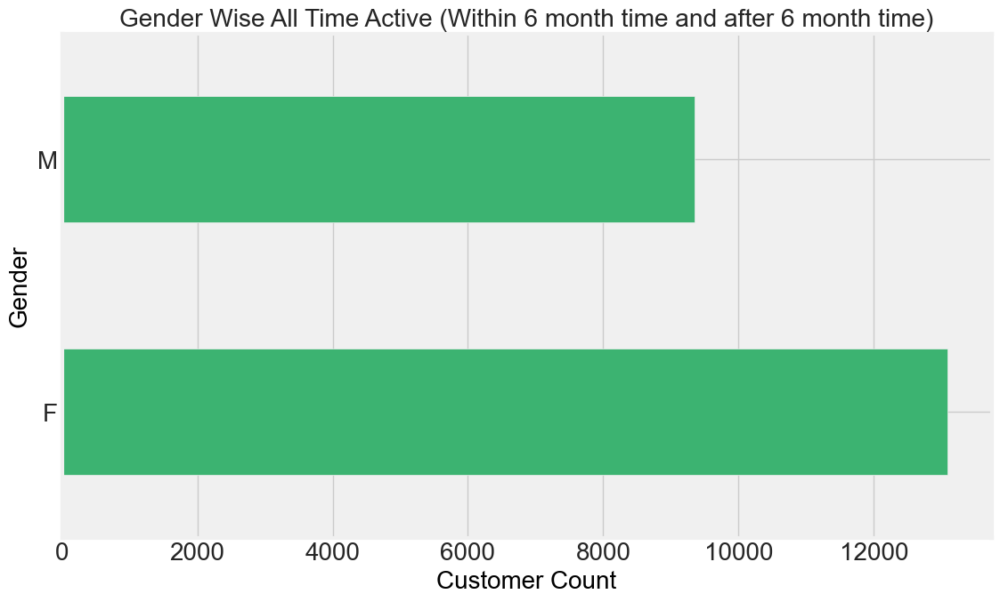

In [62]:
plt.figure(figsize=(12,7))
plt.style.use('fivethirtyeight')



cr[(cr['active_inactive_start'] == 'A') &  (cr['active_inactive_end'] == 1)].gender.value_counts().plot(kind = 'barh', 
                                   title = 'Gender Wise All Time Active (Within 6 month time and after 6 month time)', 
                                   fontsize = '20' , color = 'mediumseagreen')
plt.xlabel('Customer Count' , fontsize=20, color="black")
plt.ylabel('Gender' , fontsize=20, color="black")
plt.show()

### It is worth noting that we have approximately 29000 female clients and approximately 24000 male in the data set, thus the female all-time activity count is much higher. 

## Income and customer activity gender wise

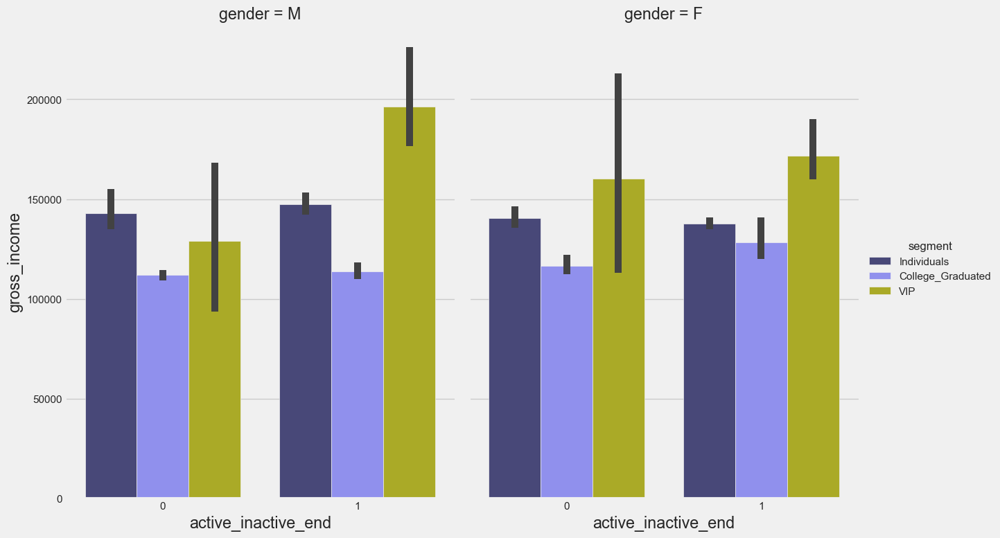

In [63]:
sns.catplot(data = cr, y = 'gross_income', x = 'active_inactive_end' , col = 'gender', kind = 'bar', hue = 'segment',
            palette = 'gist_stern', height= 8, aspect=.8)
plt.show()

### Gender wise, there is no positive relationship between consumer income and activity. It is worth noting that gross income and length are not important factors in a customer's overall activity.

## Customer activity after 6 months age wise

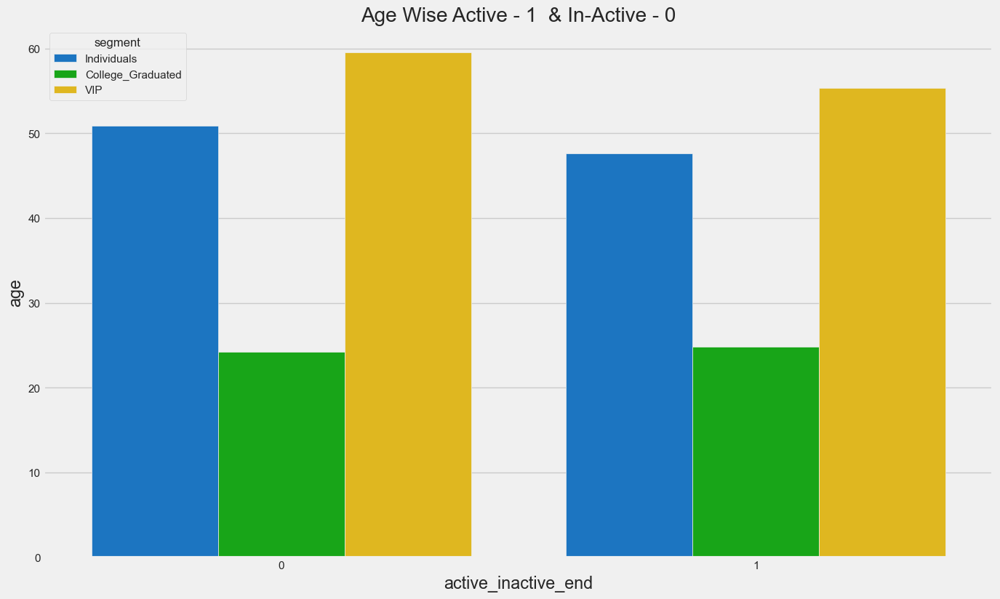

In [64]:
fig , ax = plt.subplots(figsize=(15, 9))

sns.barplot(data= cr, x='active_inactive_end', y = 'age', hue = 'segment' , ax = ax , palette = 'nipy_spectral', ci = None).set(
    title = "Age Wise Active - 1  & In-Active - 0")
plt.show()

### As observed in the previous chart, there is no association between age and activity as well.




# Gross Income and Product Analysis

In [65]:
active_before_six_month = cr['active_inactive_start'] == 'A'

active_all_before_six_month = cr['active_inactive_start']

## Gross income descriptive statistics

In [66]:
cr['gross_income'].describe()

count    5.283900e+04
mean     1.342687e+05
std      2.418738e+05
min      2.336010e+03
25%      6.861658e+04
50%      1.015898e+05
75%      1.560876e+05
max      2.889440e+07
Name: gross_income, dtype: float64

## Average gross income segment wise

In [67]:
cr.groupby('segment')['gross_income'].mean()

segment
College_Graduated    115790.894891
Individuals          141498.591188
VIP                  180191.585777
Name: gross_income, dtype: float64

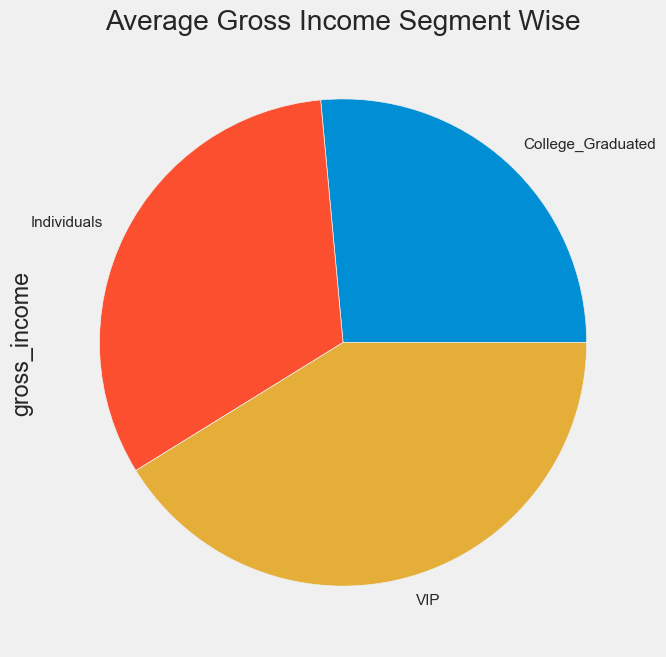

In [68]:
plt.figure(figsize=(7,15))

cr.groupby('segment')['gross_income'].mean().plot(kind = 'pie' , title = 'Average Gross Income Segment Wise')
plt.show()

### VIPs have significantly greater average income than the other two segments.



## Gross income Box Plot 

In [69]:
px.box(cr, y = 'gross_income')

### There were a significant number of outliers in the gross income column, therefore they were removed.


## Box plot whose income less than 287000

In [70]:
income = cr[cr['gross_income'] < 287000]

In [71]:
income

,gender,age,gross_income,segment,num_credit_cards,active_inactive_start,active_inactive_end,num_products,num_loans,duration,customer_duration,duration_years
0,M,21,79070.91,Individuals,0,I,0,1,0,1035,365,2.835616
1,M,23,178270.68,College_Graduated,0,I,0,1,0,1097,365,3.005479
2,M,24,31243.56,College_Graduated,0,I,1,1,0,1866,365,5.112329
3,M,24,130740.54,College_Graduated,0,I,0,1,0,1440,365,3.945205
4,M,31,112975.17,Individuals,0,I,0,0,0,376,365,1.030137
...,...,...,...,...,...,...,...,...,...,...,...,...
54024,M,24,75405.60,College_Graduated,0,I,0,1,0,1073,365,2.939726
54025,M,24,47237.01,College_Graduated,0,I,1,1,0,1147,365,3.142466
54026,F,46,106930.05,Individuals,1,A,1,8,0,6061,365,16.605479
54028,F,27,65246.79,College_Graduated,0,I,0,1,0,1447,365,3.964384


In [72]:
fig = px.box(income, y = 'gross_income')
fig

### After removing outliers from gross income, the plot shows that the majority of people's gross income is between 68000 and 143000.


## Product and its distribution for all 52839 customer

In [73]:
print(cr['num_products'].value_counts())
print('Total Customer Count :' , cr['num_products'].value_counts().sum())      


1     27108
0      9406
2      7839
3      3176
4      1877
5      1285
6       946
7       630
8       340
9       153
10       51
11       17
12        9
13        2
Name: num_products, dtype: int64
Total Customer Count : 52839


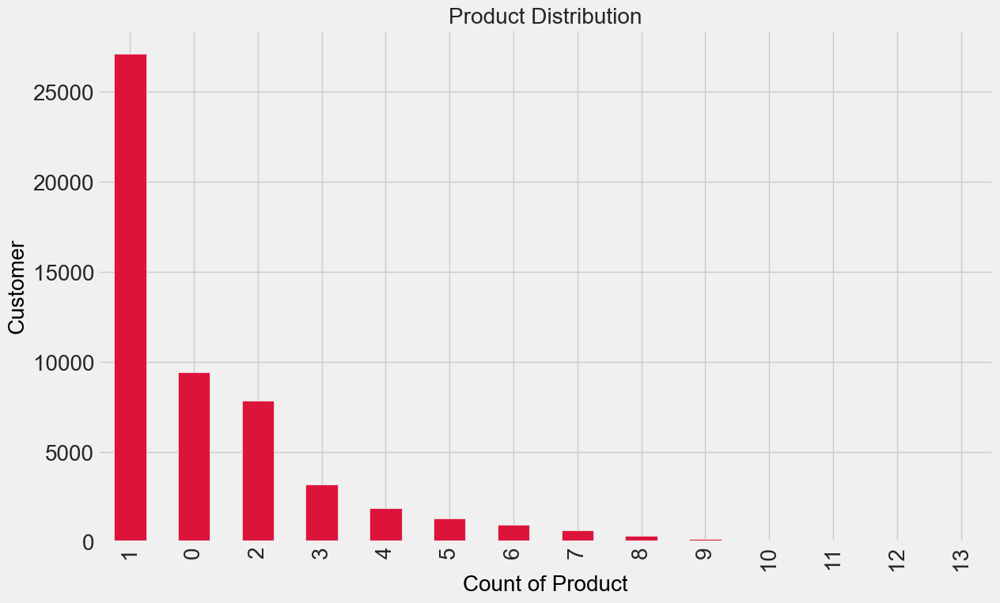

In [76]:
plt.figure(figsize=(13,8))
plt.style.use('fivethirtyeight')

cr['num_products'].value_counts().plot(kind = 'bar', 
                                   title = 'Product Distribution', 
                                   fontsize = '20' , color = 'crimson')
plt.xlabel('Count of Product' , fontsize=20, color="black")
plt.ylabel('Customer' , fontsize=20, color="black")
plt.show()

### The majority of customers own at least one product. It is advantageous to keep the focus on promoting at least one product because customers are more likely to have the one product. 


## Average age as per number of products

In [77]:
cr.groupby('num_products')['age'].mean()

num_products
0     43.521795
1     35.287406
2     48.494323
3     48.856423
4     47.139052
5     47.694942
6     47.897463
7     48.304762
8     48.702941
9     50.261438
10    49.156863
11    49.941176
12    49.111111
13    48.000000
Name: age, dtype: float64

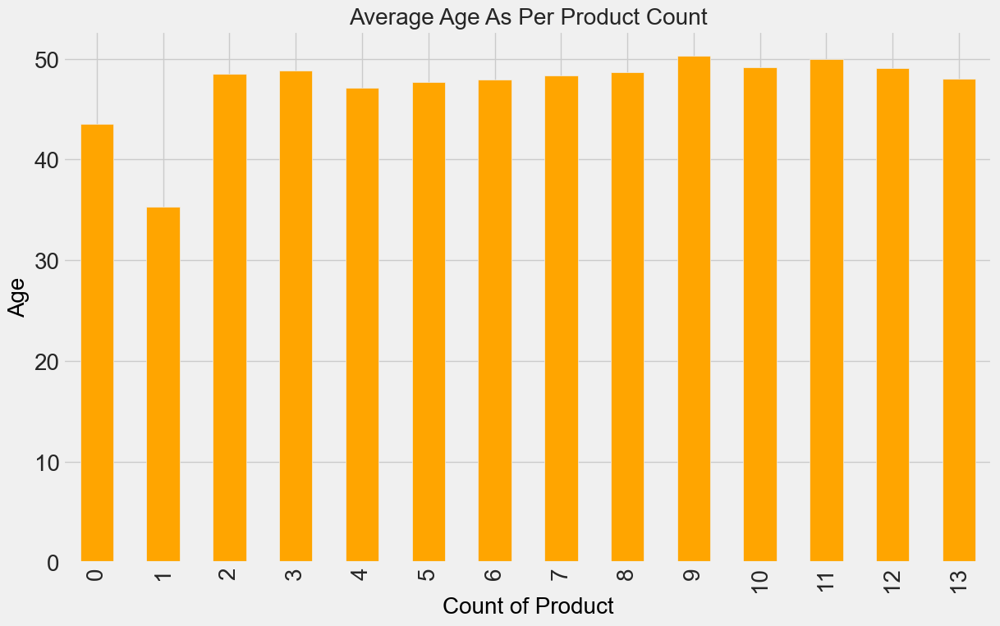

In [78]:
plt.figure(figsize=(13,8))
plt.style.use('fivethirtyeight')
cr.groupby('num_products')['age'].mean().plot(kind = 'bar' , title = 'Average Age As Per Product Count', 
                                   fontsize = '20' , color = 'orange')
plt.xlabel('Count of Product' , fontsize=20, color="black")
plt.ylabel('Age' , fontsize=20, color="black")
plt.show()

### The average age for College Grads is 24, 50 for Individuals, and 55 for VIPs, therefore according to this chart, promoting more than two products to Individuals and VIPs has the potential to boost revenue.


## Less than 287000 income and their product

In [79]:
income_count = cr['gross_income'] < 287000

In [80]:
print(cr[income_count].num_products.value_counts())
print('Total Customer Count :' ,cr[income_count].num_products.value_counts().sum())

1     25718
0      8772
2      7330
3      2937
4      1746
5      1179
6       882
7       575
8       308
9       135
10       43
11       13
12        8
13        2
Name: num_products, dtype: int64
Total Customer Count : 49648


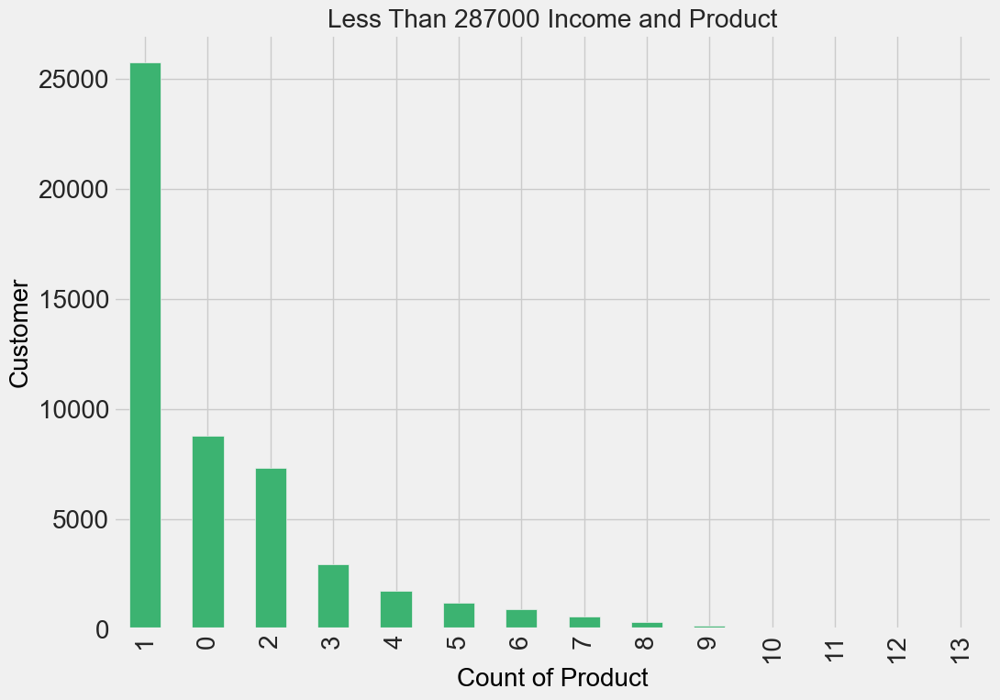

In [82]:
plt.figure(figsize=(11,8))
plt.style.use('fivethirtyeight')


cr[income_count].num_products.value_counts().plot(kind = 'bar', 
                                   title = 'Less Than 287000 Income and Product', 
                                   fontsize = '20' , color = 'mediumseagreen')
plt.xlabel('Count of Product' , fontsize=20, color="black")
plt.ylabel('Customer' , fontsize=20, color="black")
plt.show()

### It is worthwhile to promote the majority of all products to consumers with gross incomes less than 287000, as this chart shows that those with less than 287k are more likely to purchase any product from us.


## More than 287000 income and their product

In [83]:
print(cr[~income_count].num_products.value_counts())
print('Total Customer Count :' , cr[~income_count].num_products.value_counts().sum())

1     1390
0      634
2      509
3      239
4      131
5      106
6       64
7       55
8       32
9       18
10       8
11       4
12       1
Name: num_products, dtype: int64
Total Customer Count : 3191


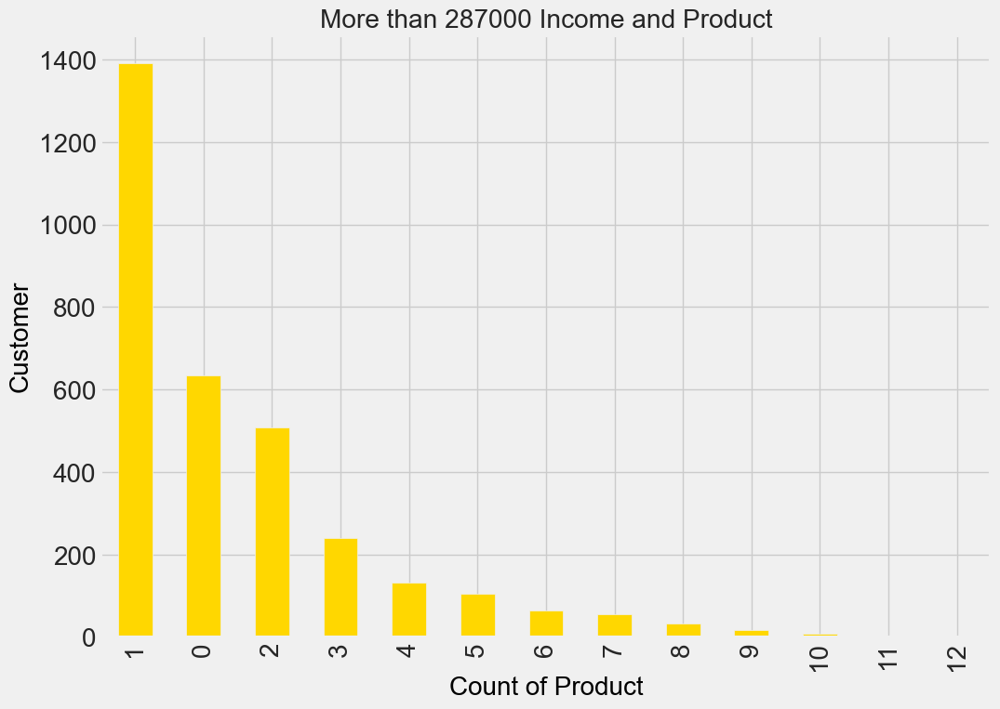

In [84]:
plt.figure(figsize=(11,8))
plt.style.use('fivethirtyeight')

cr[~income_count].num_products.value_counts().plot(kind = 'bar', 
                                   title = 'More than 287000 Income and Product', 
                                   fontsize = '20' , color = 'gold')
plt.xlabel('Count of Product' , fontsize=20, color="black")
plt.ylabel('Customer' , fontsize=20, color="black")
plt.show()

### Customers with greater than 287000 gross income tend to purchase less products from us, but as the chart illustrates, this is an excellent opportunity to target them in order to improve revenue.


## Customer count whose income is more than 287000
### (Segment wise)

In [85]:
cr[~income_count].segment.value_counts()

Individuals          2149
College_Graduated     787
VIP                   255
Name: segment, dtype: int64

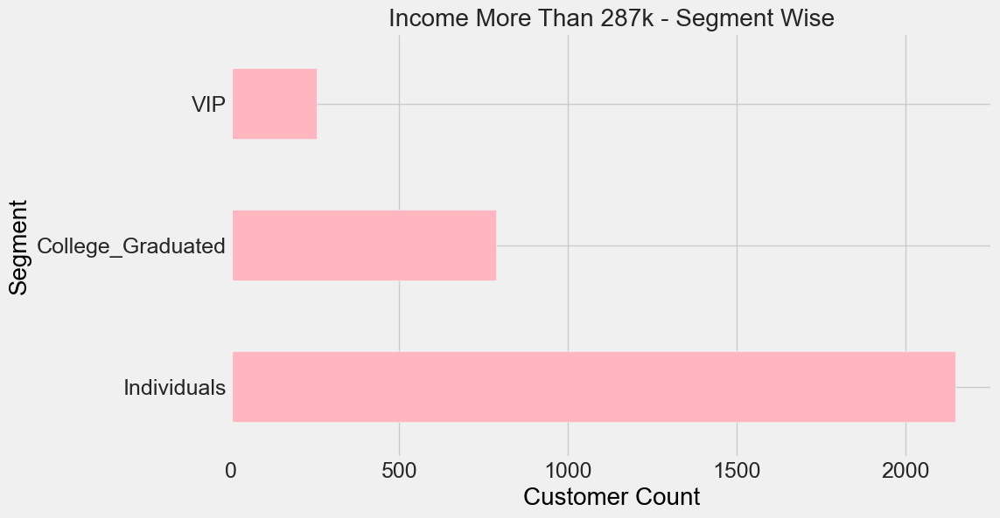

In [86]:
plt.figure(figsize=(10,6))
plt.style.use('fivethirtyeight')
cr[~income_count].segment.value_counts().plot(kind = 'barh', 
                                              
title = 'Income More Than 287k - Segment Wise', fontsize = '18' , color = 'lightpink')
plt.xlabel('Customer Count' , fontsize=20, color="black")
plt.ylabel('Segment' , fontsize=20, color="black")
plt.show()

### According to this plot, the focus should be on Individuals and College Graduates with a gross income of more than $287k.


## Gross income and loan plot on entire dataset

In [87]:
px.scatter(cr, y = 'gross_income' , x = 'num_loans', color = 'segment' , title = 'Gross Income and Loan Relationship',
      width=1000, height=700)

### This scatter plot reveals that customers with less than $287k are more likely to have a loan.


## Gross income less than 287000
### (Loan holder and non holder)

In [88]:
px.scatter(income, y = 'gross_income' , x = 'num_loans', color = 'segment' , title = 'Gross Income Less Than 287000 and Loan Relationship',
      width=1000, height=700)

### This scatter plot reveals that customers with less than $287k are more likely to have a loan.

# Credit Card and Loan Analysis

## Own credit card out of all customer

In [89]:
cr['num_credit_cards'].value_counts()

0    50185
1     2654
Name: num_credit_cards, dtype: int64

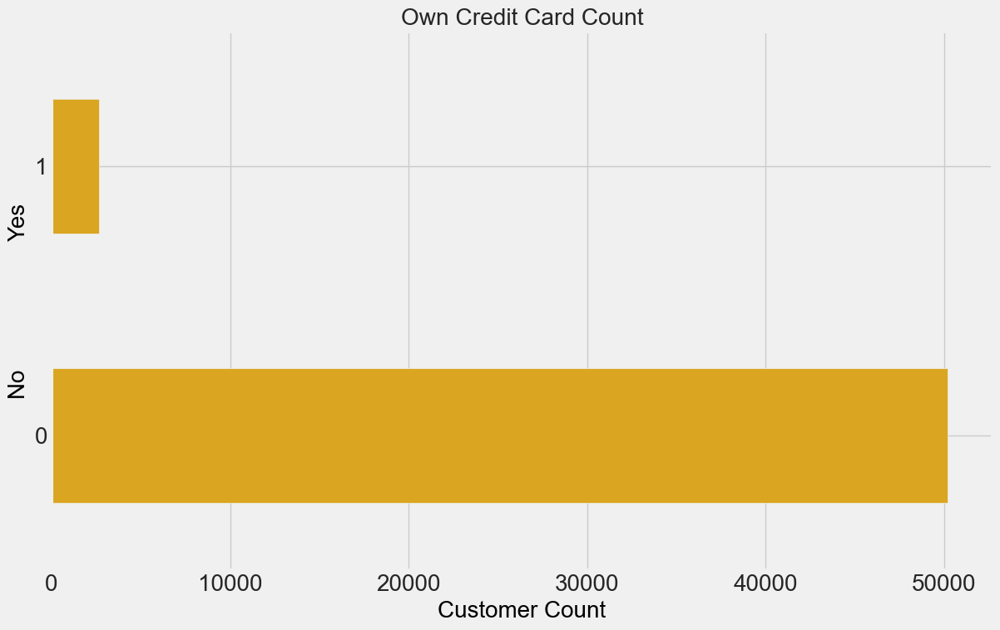

In [103]:
plt.figure(figsize=(13,8))

cr['num_credit_cards'].value_counts().plot(kind = 'barh' , title = 'Own Credit Card Count',
                                   fontsize = '20' , color = 'goldenrod')
plt.xlabel('Customer Count' , fontsize=20, color="black")
plt.ylabel('No                    Yes' , fontsize=20, color="black")
plt.show()

### Only 5% of all consumers have a credit card.


## Owing credit card as per the segment

In [92]:
own_credit_card = cr['num_credit_cards'] == 1
cr[own_credit_card].segment.value_counts()

Individuals          2004
VIP                   508
College_Graduated     142
Name: segment, dtype: int64

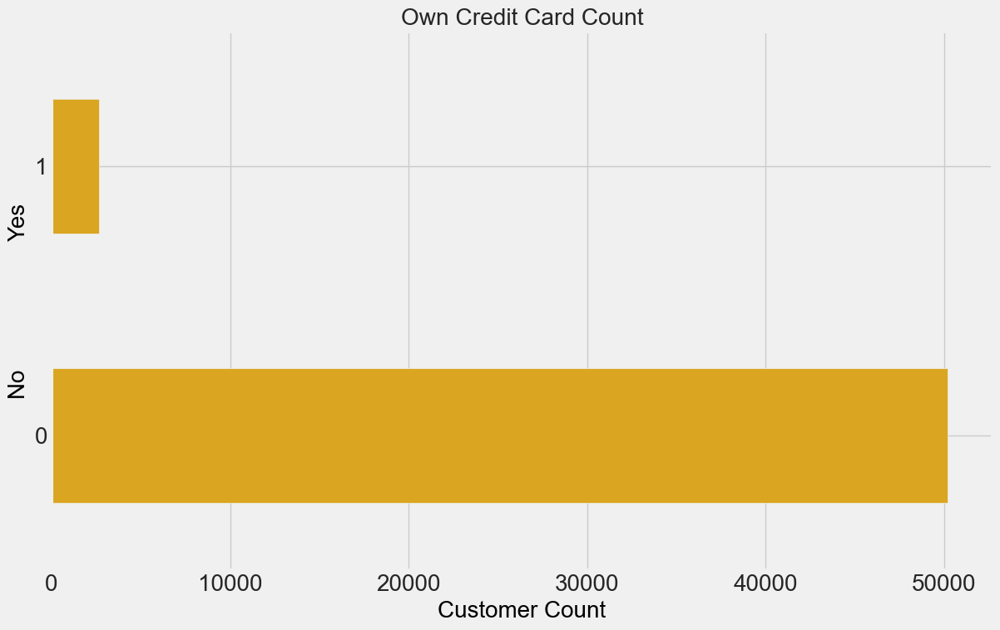

<Figure size 700x1500 with 0 Axes>

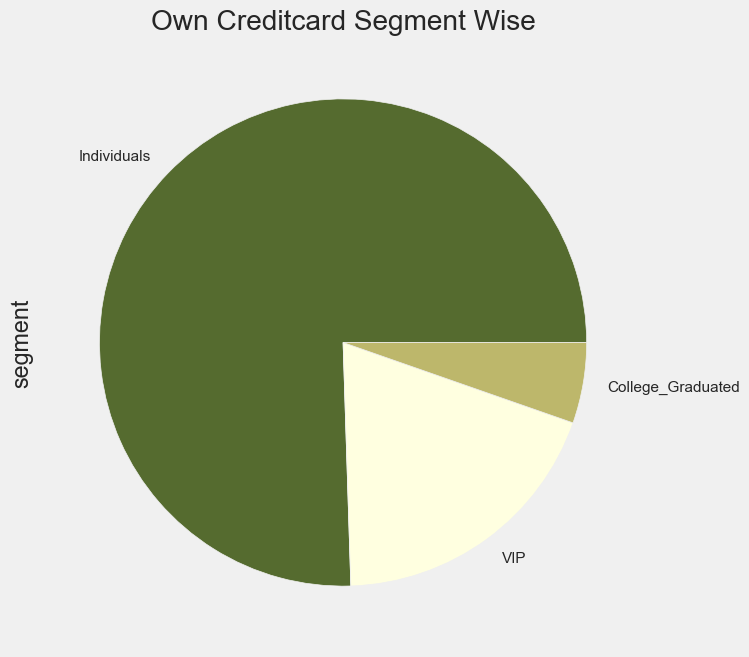

In [93]:
plt.figure(figsize=(7,15))

cr[own_credit_card].segment.value_counts().plot(kind = 'pie' , 
                                   title = 'Own Creditcard Segment Wise' , colors=['darkolivegreen', 'lightyellow', 'darkkhaki'])
plt.show()

### Credit card distribution is highest (75 percent) in the Individual category, yet despite having only 2425 consumers in the VIP group, their credit card share is 19 percent. College grads have fewer credit cards.

## Age and credit card

In [94]:
px.box(cr, y = 'age' , x = 'num_credit_cards', color = 'segment' , title = 'Age & Creditcard Distribution Segment Wise',
      width=900, height=600)

### According to this box plot, the majority of consumers in the Individuals category are between the ages of 41 and 53, and VIPs are between the ages of 45 and 58, therefore we can market more credit cards in this age range. The majority of college graduates do not hold a credit card.


##  Customer distrubution age wise out of 2654 customers who own credit card

### (Maximum number of credit card own by age group)

In [95]:
cr[own_credit_card].age.value_counts().nlargest(15)

43    137
45    137
44    123
46    122
48    121
42    112
41    112
47    111
50     95
49     95
51     94
40     78
54     76
39     71
52     70
Name: age, dtype: int64

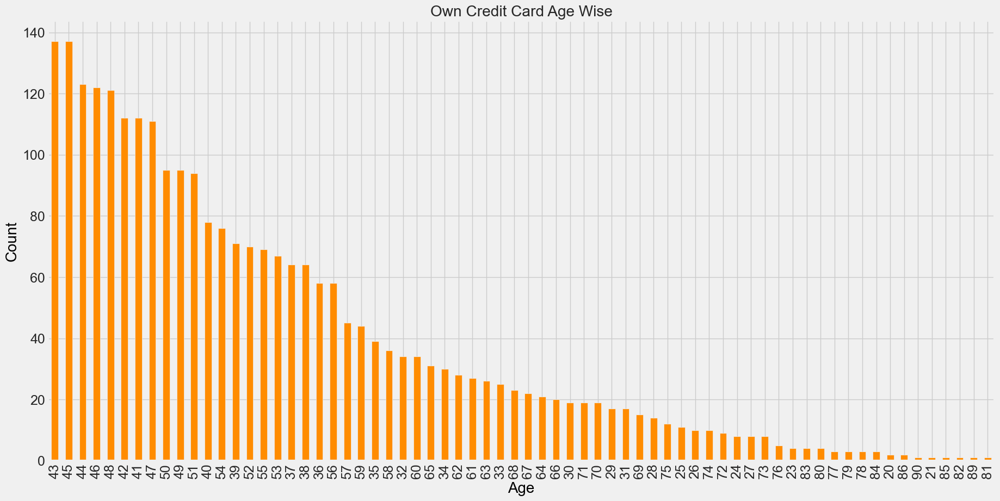

In [98]:
fig , ax = plt.subplots(figsize=(20, 10))

cr[own_credit_card].age.value_counts().plot(kind = 'bar' , title = 'Own Credit Card Age Wise',
                                   fontsize = '18' , color = 'darkorange')
plt.xlabel('Age' , fontsize=20, color="black")
plt.ylabel('Count' , fontsize=20, color="black")
plt.show()

### According to the bar plot, the optimal age to promote credit cards is between the ages of 41 and 53.
 

## Loan taken count out of all customers

In [99]:
cr['num_loans'].value_counts()

0    52346
1      493
Name: num_loans, dtype: int64

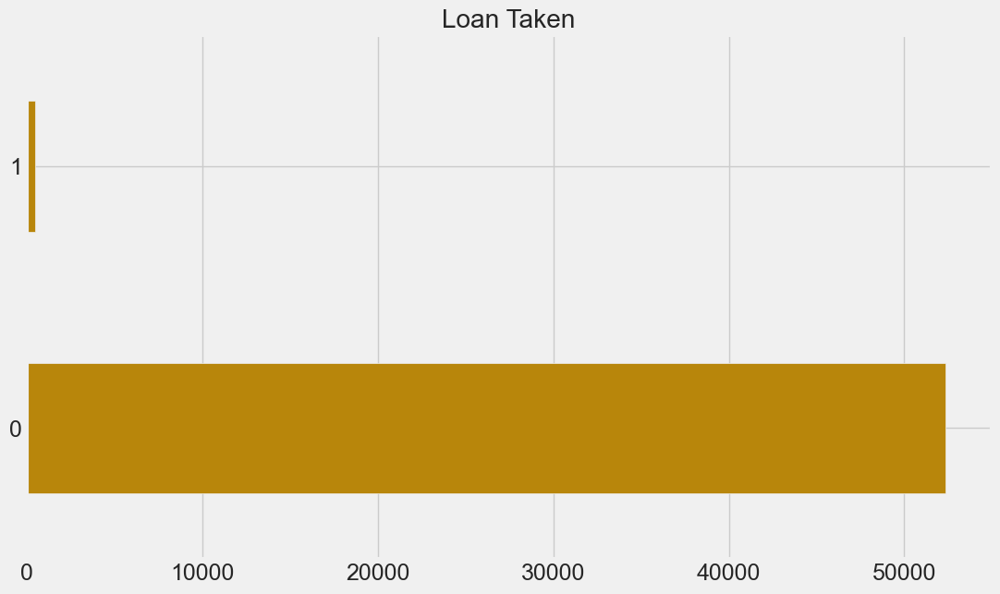

In [102]:
income = cr['gross_income'] > 1

fig , ax = plt.subplots(figsize=(12, 7))
cr[income].num_loans.value_counts().plot(kind = 'barh', title = 'Loan Taken', 
                                   fontsize = '18' , color = 'darkgoldenrod')
plt.show()

### Because just 493 people applied for the loan, there is plenty of potential to promote appropriate loans to households with gross incomes less than $287,000.


## Loan taken as per the segment

In [104]:
taken_loan = cr['num_loans'] == 1
cr[taken_loan].segment.value_counts()

Individuals          430
VIP                   60
College_Graduated      3
Name: segment, dtype: int64

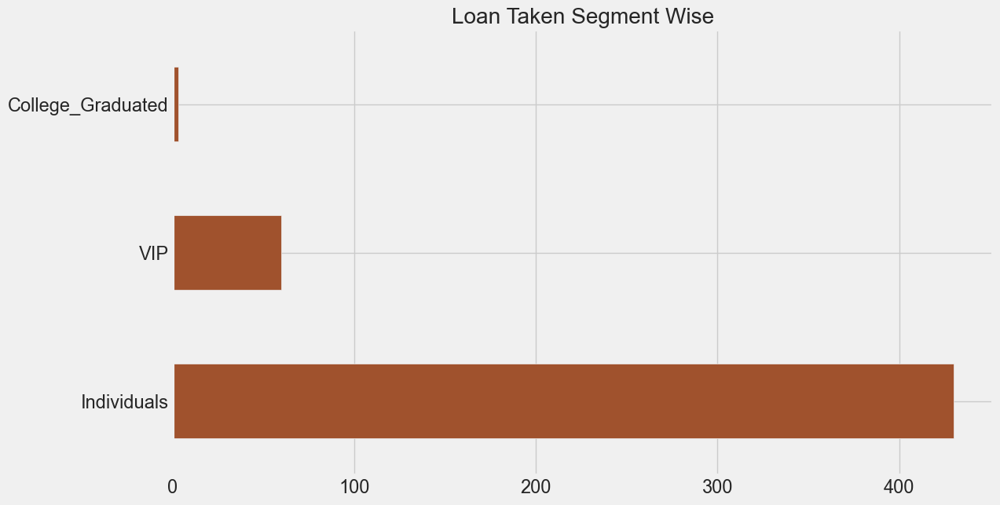

In [105]:
fig , ax = plt.subplots(figsize=(12, 7))

cr[taken_loan].segment.value_counts().plot(kind = 'barh' , title = 'Loan Taken Segment Wise', 
                                   fontsize = '17' , color = 'sienna')
plt.show()

### Market more loans to the Individual sector because they have requested the most loans.


## Age wise distribution out of 493 customers who took loan

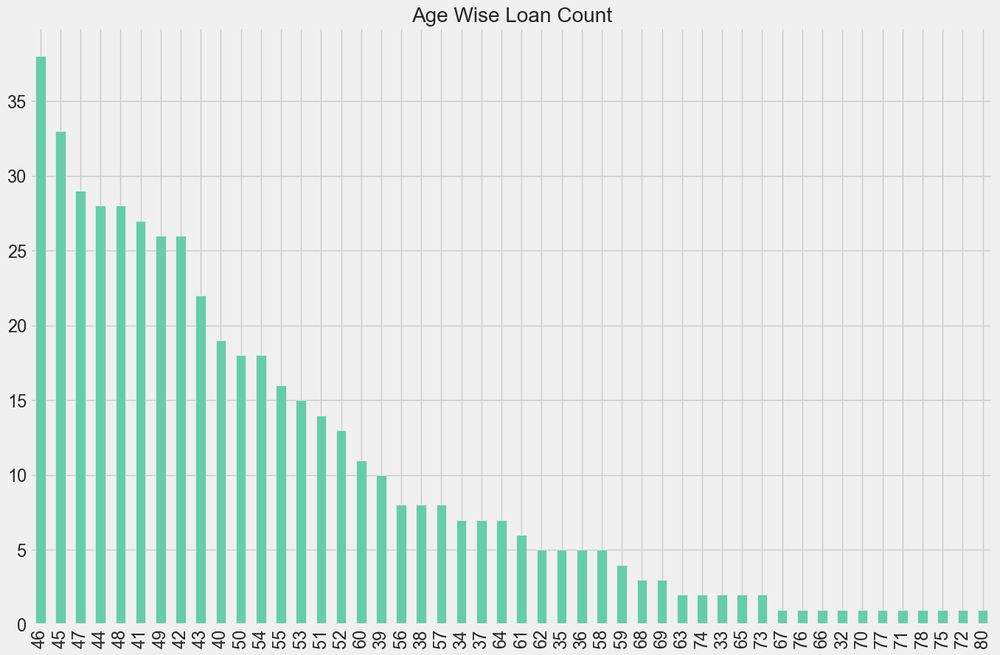

In [106]:
loan_taken = cr['num_loans'] == 1

fig , ax = plt.subplots(figsize=(15, 10))
cr[loan_taken].age.value_counts().plot(kind = 'bar', title = 'Age Wise Loan Count', 
                                   fontsize = '17' , color = 'mediumaquamarine')
plt.show()

### This plot shows that clients in their 40s and 50s have taken out the most loans, thus we should keep them in mind when marketing the loan.


# 11. Statistical analysis

In [109]:
#creating one column for all time active and all time inactive
cr['alltime_active_inactive'] = np.where((cr['active_inactive_start'] == 'A') & 
                                         (cr['active_inactive_end'] == 1), 'active', 'inactive')
cr

,gender,age,gross_income,segment,num_credit_cards,active_inactive_start,active_inactive_end,num_products,num_loans,duration,customer_duration,duration_years,alltime_active_inactive
0,M,21,79070.91,Individuals,0,I,0,1,0,1035,365,2.835616,inactive
1,M,23,178270.68,College_Graduated,0,I,0,1,0,1097,365,3.005479,inactive
2,M,24,31243.56,College_Graduated,0,I,1,1,0,1866,365,5.112329,inactive
3,M,24,130740.54,College_Graduated,0,I,0,1,0,1440,365,3.945205,inactive
4,M,31,112975.17,Individuals,0,I,0,0,0,376,365,1.030137,inactive
...,...,...,...,...,...,...,...,...,...,...,...,...,...
54024,M,24,75405.60,College_Graduated,0,I,0,1,0,1073,365,2.939726,inactive
54025,M,24,47237.01,College_Graduated,0,I,1,1,0,1147,365,3.142466,inactive
54026,F,46,106930.05,Individuals,1,A,1,8,0,6061,365,16.605479,active
54028,F,27,65246.79,College_Graduated,0,I,0,1,0,1447,365,3.964384,inactive


In [150]:
#subsetting dataframe as a pivot table
pivot_table_segment = pd.pivot_table(cr, values='gross_income', index='segment', columns='alltime_active_inactive', aggfunc='count')

df1 = pd.DataFrame(pivot_table_segment)

#df1['Observed_Total_Active_Percentage'] = (df1['active'] / (df1['active'] + df1['inactive'])) * 100

print(df1)

alltime_active_inactive  active  inactive
segment                                  
College_Graduated          4621     13889
Individuals               15424     16480
VIP                        2391        34


### 1. Hypothesis: 
H0: There is relation between segment and activity status of customer

In [151]:
#chi-square test for segment wise # between two categ vars #contingency table
chi2_stat, p_value, dof, expected = stats.chi2_contingency(pivot_table_segment)

In [152]:
print("Chi-Square Test Result:")
print("Chi2 Statistic:", chi2_stat)
print("P-value:", p_value)
print("Degrees of Freedom:", dof)
print("Expected Frequencies Table:")
print(expected)

Chi-Square Test Result:
Chi2 Statistic: 5899.228732289914
P-value: 0.0
Degrees of Freedom: 2
Expected Frequencies Table:
[[ 7859.54238347 10650.45761653]
 [13546.77688828 18357.22311172]
 [ 1029.68072825  1395.31927175]]


Since p value is less than 0.05 level of significance, we reject the null hypothesis. Therefore there is no relation between customer segment and activity status

#### Calculating expected frequencies for active and inactive customers across segments

In [154]:
#expected values are converted into dataframe and compare to the expected values
values = [['College_Graduated',7859.54238347, 10650.45761653],
          ['Individuals',13546.77688828, 18357.22311172],
          ['VIP',1029.68072825, 1395.31927175]]

columns = ['segment','Expected_Active', 'Expected_Inactive']

df_expected = pd.DataFrame(values, columns=columns)

#df_expected['Expected_active_Percentage'] = (df_expected['Expected_Active'] / 
                                                #(df_expected['Expected_Active'] + df_expected['Expected_Inactive'])) * 100

df_expected

,segment,Expected_Active,Expected_Inactive
0,College_Graduated,7859.542383,10650.457617
1,Individuals,13546.776888,18357.223112
2,VIP,1029.680728,1395.319272


In [163]:
#Merge the two dataframes 
merged_df = pd.merge(df1, df_expected, on='segment', suffixes=('_df1', 'df_expected'))
merged_df['active rate'] = ((merged_df['active']-merged_df['Expected_Active'])**2/merged_df['Expected_Active'])/100
merged_df['inactive rate'] = 100- (((merged_df['active']-merged_df['Expected_Active'])**2/merged_df['Expected_Active'])/100)
#merged_df.drop('Expected_active_Percentage')
merged_df

,segment,active,inactive,Expected_Active,Expected_Inactive,active rate,inactive rate
0,College_Graduated,4621,13889,7859.542383,10650.457617,13.344488,86.655512
1,Individuals,15424,16480,13546.776888,18357.223112,2.601332,97.398668
2,VIP,2391,34,1029.680728,1395.319272,17.997716,82.002284


In [160]:
#dataframe for plotting
merged_df_plot = pd.merge(df1, df_expected, on='segment', suffixes=('_df1', 'df_expected'))
#merged_df['percentage'] = ((merged_df['active']-merged_df['Expected_Active'])**2/merged_df['Expected_Active'])/100
#merged_df.drop('Expected_active_Percentage')
merged_df_plot

,segment,active,inactive,Expected_Active,Expected_Inactive
0,College_Graduated,4621,13889,7859.542383,10650.457617
1,Individuals,15424,16480,13546.776888,18357.223112
2,VIP,2391,34,1029.680728,1395.319272


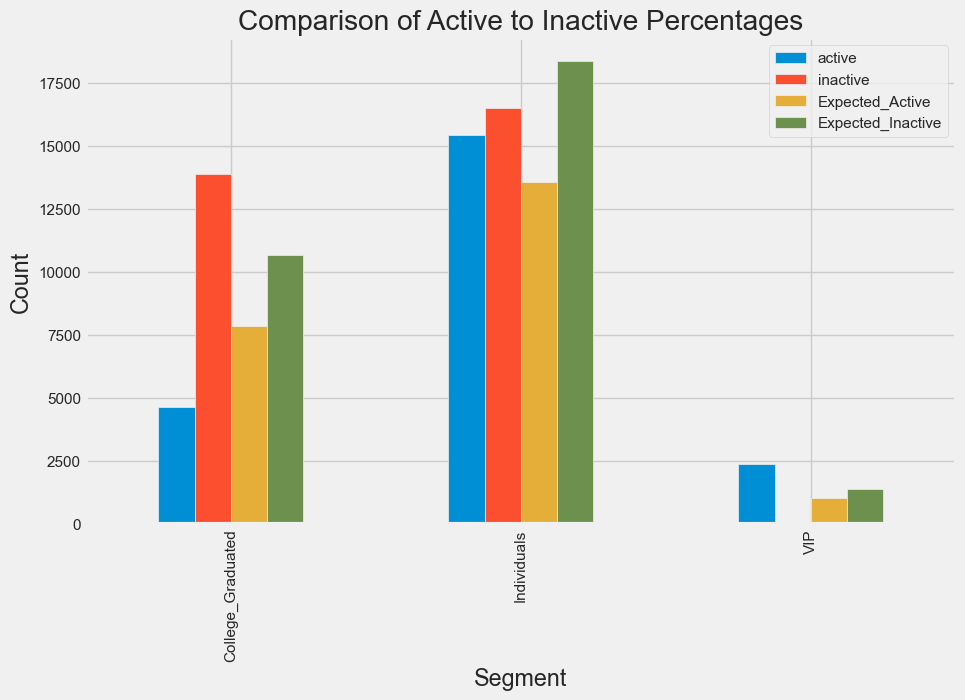

In [161]:
# Create a grouped bar plot
merged_df_plot.plot(x='segment', kind='bar', figsize=(10, 6))
plt.title('Comparison of Active to Inactive Percentages')
plt.xlabel('Segment')
plt.ylabel('Count')
plt.legend(loc='upper right')
plt.show()

Since college graduates show 0.58% of expected retention percentage, the bank would have to look into strategies that would focus more on the college graduates segment. 

#### For the first 5 questions performed chi square test as the variables are categorical to categorical(numerical) and for questions 6,7,8 performed t-test as variables are categorical and numerical

#### Q1. In future which of the customer segments (college, individual, VIP) can be expected to remain active compared to others?

##### ANS: VIP can be expected to remain active(17.9%)

#### Q2. In future which of the customer segments (college, individual, VIP) can be expected to remain inactive compared to others?
##### ANS: Individuals can be expected to remain inactive(97.4% )

#### Q3. In future, which of the customer segments (college, individual, VIP) can be expected to become inactive compared to others?
##### ANS: Individuals can be expected to become inactive(97.4% )

### 2. Hypothesis
H0: There is relation between gender and activity status of customer

In [132]:
#creating a dataframe with required variables for contigency table
pivot_table = pd.pivot_table(cr, values='duration_years', index='gender', columns='alltime_active_inactive', aggfunc='count')
pivot_table

alltime_active_inactive,active,inactive
gender,,
F,13084,15941
M,9352,14462


In [123]:
#the Chi-Square test between Gender and alltime_active_inactive (Activity status)
chi2_stat, p_value, dof, expected = stats.chi2_contingency(pivot_table)

#test results
print("Chi-Square Test Result:")
print("Chi2 Statistic:", chi2_stat)
print("P-value:", p_value)
print("Degrees of Freedom:", dof)
print("Expected Frequencies Table:")
print(expected)

Chi-Square Test Result:
Chi2 Statistic: 180.3364309607316
P-value: 4.092268878155316e-41
Degrees of Freedom: 1
Expected Frequencies Table:
[[12324.32294328 16700.67705672]
 [10111.67705672 13702.32294328]]


Since p value is less than 0.05 level of significance, we reject the null hypothesis. Therefore there is no relation between gender and activity status

In [130]:
cr['alltime_active_inactive_int'] = np.where((cr['active_inactive_start'] == 'A') & 
                                         (cr['active_inactive_end'] == 1), 1, 0)
cr

,gender,age,gross_income,segment,num_credit_cards,active_inactive_start,active_inactive_end,num_products,num_loans,duration,customer_duration,duration_years,alltime_active_inactive,alltime_active_inactive_int
0,M,21,79070.91,Individuals,0,I,0,1,0,1035,365,2.835616,inactive,0
1,M,23,178270.68,College_Graduated,0,I,0,1,0,1097,365,3.005479,inactive,0
2,M,24,31243.56,College_Graduated,0,I,1,1,0,1866,365,5.112329,inactive,0
3,M,24,130740.54,College_Graduated,0,I,0,1,0,1440,365,3.945205,inactive,0
4,M,31,112975.17,Individuals,0,I,0,0,0,376,365,1.030137,inactive,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
54024,M,24,75405.60,College_Graduated,0,I,0,1,0,1073,365,2.939726,inactive,0
54025,M,24,47237.01,College_Graduated,0,I,1,1,0,1147,365,3.142466,inactive,0
54026,F,46,106930.05,Individuals,1,A,1,8,0,6061,365,16.605479,active,1
54028,F,27,65246.79,College_Graduated,0,I,0,1,0,1447,365,3.964384,inactive,0


In [131]:
#calculation of variation and standard deviation
variance_by_gender = cr.groupby('gender')['alltime_active_inactive_int'].var()

std_dev_by_gender = cr.groupby('gender')['alltime_active_inactive_int'].std()

print("Variance of 'duration' by Gender:")
print(variance_by_gender)

print("\nStandard Deviation of 'duration' by Gender:")
print(std_dev_by_gender)
#the less variability in their duration value is more stable gender group

Variance of 'duration' by Gender:
gender
F    0.247586
M    0.238499
Name: alltime_active_inactive_int, dtype: float64

Standard Deviation of 'duration' by Gender:
gender
F    0.497580
M    0.488363
Name: alltime_active_inactive_int, dtype: float64


#### Q4 Which of Male/Female customers are more stable and do not change their activity/inactivity level much?

##### ANS: By observing the above values, there is slightly less variation (0.24) in activity status of male customers compared to female customers (0.25). However there is no statistically significant change in stability of activity status by gender.

##### Q5 Which of Male/Female customers are more volatile and change their activity/inactivity level?

##### ANS: By observing the above values, there is slightly more variation (0.25) in activity status of female customers compared to male customers (0.24). However there is no statistically significant change in stability/volatility of activity status by gender.

### 3. Hypothesis
H0: There is relation between gross income and activity status of customer

In [133]:
#performing t-test for active-inactive by gross_income #1 categ var vs 1 numerical var
avg_income_by_status = cr.groupby('alltime_active_inactive')['gross_income'].mean()
avg_income_by_status

alltime_active_inactive
active      142452.906200
inactive    128229.178361
Name: gross_income, dtype: float64

In [134]:
income_active = cr[cr['alltime_active_inactive'] == 'active']['gross_income'] #income of active customers
income_inactive = cr[cr['alltime_active_inactive'] == 'inactive']['gross_income'] #income of inactive customers

In [135]:
t_stat, p_value = stats.ttest_ind(income_active, income_inactive, equal_var=False)

In [136]:
print("T-Test Result:")
print("T-statistic:", t_stat)
print("P-value:", p_value)

T-Test Result:
T-statistic: 6.807286256874377
P-value: 1.0055136333003263e-11


Since p value is less than 0.05 level of significance, we reject the null hypothesis. Therefore there is no relation between gross income and activity status

#### Q6. What impact does Income have on customer activity/ inactivity?

##### ANS: gross_income has less impact on the customer activity status statistically.

### 4. Hypothesis
H0: There is relation between age and activity status of customer

In [138]:
#t-test for active_inactive by age #1 categ var vs 1 numerical var
avg_age_by_status = cr.groupby('alltime_active_inactive')['age'].mean()
avg_age_by_status

alltime_active_inactive
active      43.660858
inactive    38.658389
Name: age, dtype: float64

In [139]:
age_active = cr[cr['alltime_active_inactive'] == 'active']['age'] #age of active customers
age_inactive = cr[cr['alltime_active_inactive'] == 'inactive']['age'] #age of inactive customers


In [140]:
t_stat, p_value = stats.ttest_ind(age_active, age_inactive, equal_var=False)  

In [141]:
print("T-Test Result:")
print("T-statistic:", t_stat)
print("P-value:", p_value)


T-Test Result:
T-statistic: 33.877993134281056
P-value: 8.591713255244121e-249


Since p value is less than 0.05 level of significance, we reject the null hypothesis. Therefore there is no relation between age and activity status

#### Q7. What impact does Age have on customer activity/ inactivity?

##### ANS: age does not impact customer activity status

### 5. Hypothesis
H0: There is relation between duration and activity status of customer

In [142]:
# t-test for active_inactive by duration #1 categ var vs 1 numerical var
avg_duration_by_status = cr.groupby('alltime_active_inactive')['duration_years'].mean()
avg_duration_by_status

alltime_active_inactive
active      9.056693
inactive    7.195037
Name: duration_years, dtype: float64

In [143]:
duration_active = cr[cr['alltime_active_inactive'] == 'active']['duration_years'] #total duration of active customer in years
duration_inactive = cr[cr['alltime_active_inactive'] == 'inactive']['duration_years']#total duration of inactive customer in years

In [144]:
t_stat, p_value = stats.ttest_ind(duration_active, duration_inactive, equal_var=False)

In [145]:
print("T-Test Result:")
print("T-statistic:", t_stat)
print("P-value:", p_value)

T-Test Result:
T-statistic: 37.946128521933026
P-value: 0.0


Since p value is less than 0.05 level of significance, we reject the null hypothesis. Therefore there is no relation between duration and activity status

#### Q8. What impact does Duration has on customer activity/ inactivity?

##### ANS: As the p-value is zero there is no significant impact of duration on the customer activity status.